In [1]:
import os, sys, json, time, hashlib, cv2, psutil
import numpy  as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.ndimage   as ndi
import multiprocessing as mp

sys.path.append('../../..')
from Synthetic.index   import SyntheticGenerator
from Nature.index      import NatureSelector
from Nature.Processing.Memory.index import Memory
from Model.utils.index import getFiles

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)

# DATASETS
- Tiles reais 128³ de Marlim em `(inline, z, xline)`, na escala [0,1] do p01/p99 do slab, separados por conteúdo em `calm`, `dead` e `faulted` pelo `../Marlim/Analysis.ipynb`
- O σ mediano de cada região é o alvo do ganho do gerador
- `WORKERS` é o teto de processos do notebook inteiro: a vazão satura na banda de memória entre 6 e 8 processos, e eles só usam CPU ociosa, então a área de trabalho e o acesso remoto passam sempre na frente

In [2]:
REGIONS  = ('calm', 'dead', 'faulted')
CLIP     = 0.45                                        # SATURAÇÃO SIMÉTRICA DO SLAB REAL, O TRILHO DO FORMAT
SEED     = 20260915                                    # SEMENTES FIXAS DA BUSCA: A MESMA CONFIGURAÇÃO DÁ SEMPRE A MESMA NOTA
N_IMAGES = {'calm': 12, 'dead': 12, 'faulted': 8}      # TILES POR AVALIAÇÃO: NO faulted 8 JÁ TÊM O RUÍDO DE 12
WORKERS  = 6                                           # PROCESSOS SIMULTÂNEOS: ACIMA DE 6 SÓ O faulted GANHA, E POUCO
MAX_TEMP = 88                                          # °C: ACIMA DISSO O PROCESSO ESPERA ANTES DE COMEÇAR OUTRO TILE

In [3]:
marlim = {region: getFiles(f'../Marlim/files/{region}') for region in REGIONS}
SIGMA  = pd.read_csv('../Marlim/files/DataBase.csv').groupby('region').img_std.median()
SIGMA

region
calm       0.192141
dead       0.016145
faulted    0.145699
Name: img_std, dtype: float64

# CLASSE DE SEMELHANÇA
- Cada imagem vira uma **régua de 33 atributos sísmicos** medidos em 8 seções, 4 inline e 4 crossline; numa imagem 2D a seção é a própria imagem
- Os grupos são `amplitude`, `espectro`, `estrutura` (coerência e mergulho pelo tensor de estrutura), `continuidade` (correlação lateral) e `falhas` (descontinuidade e lineamentos pela **semblance com direção de mergulho**)
- Cada atributo é comparado pelo **coeficiente de energia** (Rizzo & Székely, 2016), que só zera quando as duas distribuições são iguais:

$$H = \frac{2A - B - C}{2A + \varepsilon}, \qquad \text{sim} = 100\,(1 - H)$$

- $A$ é a distância média entre os dois lados, $B$ e $C$ as distâncias médias dentro de cada lado, e $\varepsilon$ é um quarto do IQR do atributo no lado real: diferença menor que isso não conta
- Entre **duas imagens** não existe dispersão interna, então $B$ e $C$ viram a distância típica entre dois tiles reais da mesma região: duas imagens tão parecidas quanto dois tiles reais da mesma região dão 100%
- A nota é a média dentro de cada grupo e a **média geométrica ponderada** entre os grupos, então um grupo ruim não é compensado por outro bom

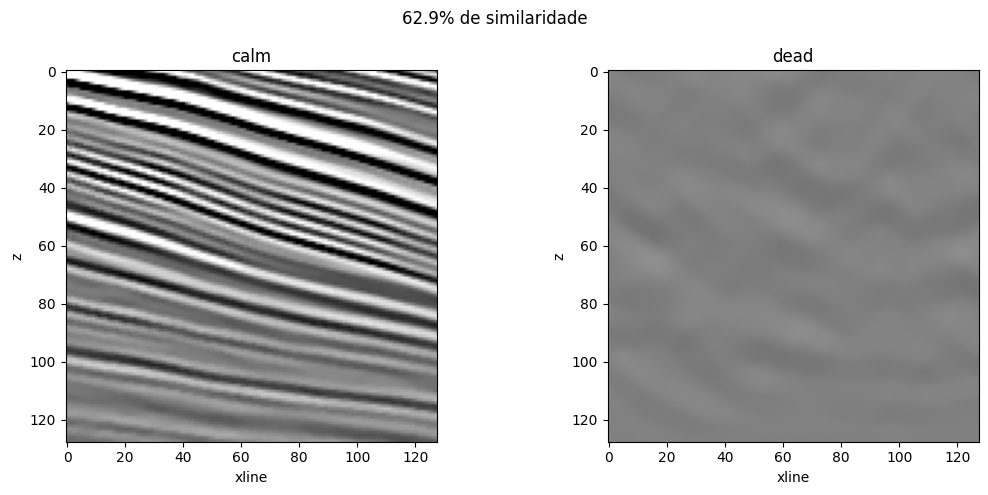

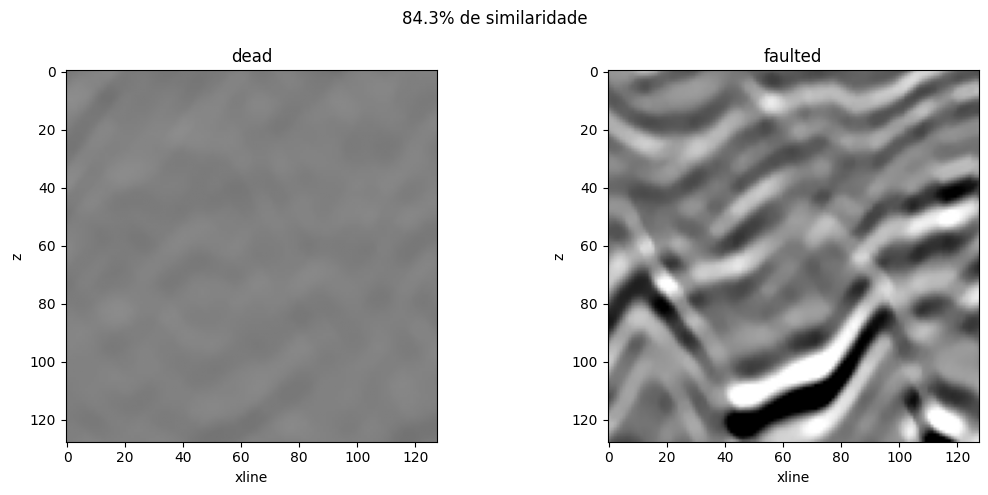

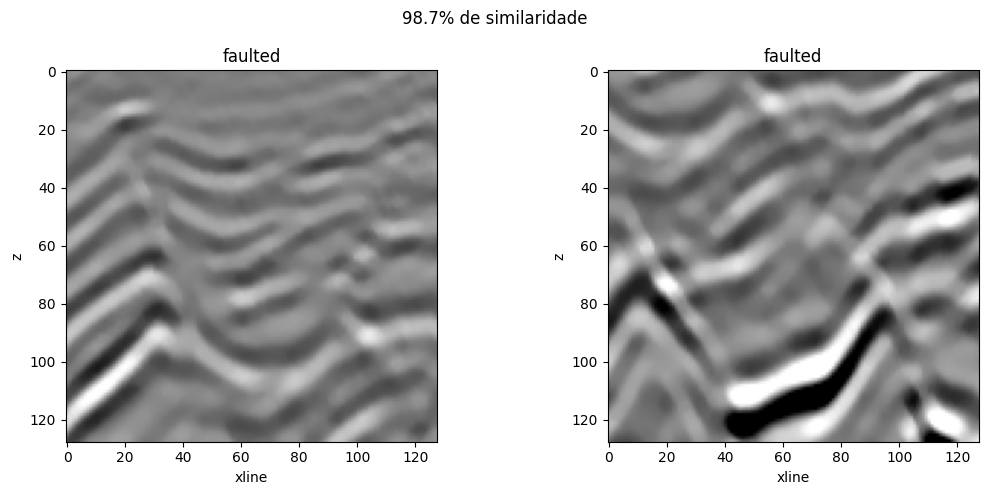

In [4]:
# ESPERA A CPU ESFRIAR ANTES DE COMEÇAR UM TILE: COM TODOS OS NÚCLEOS OCUPADOS O PICO PASSA DE 90 °C
def waitCool():
    while max([sensor.current for sensor in psutil.sensors_temperatures().get('coretemp', [])], default=0) > MAX_TEMP:
        time.sleep(5)    # s

# OS PROCESSOS SÓ RODAM EM CPU OCIOSA: ÁREA DE TRABALHO E ACESSO REMOTO NUNCA ESPERAM PELA BUSCA
def setWorker():
    os.sched_setscheduler(0, os.SCHED_IDLE, os.sched_param(0))
    cv2.setNumThreads(1)

# UM POOL POR CHAMADA, POR fork: OS PROCESSOS NASCEM COM AS DEFINIÇÕES ATUAIS DO NOTEBOOK E MORREM NO FIM DO with
def getPool():
    return mp.get_context('fork').Pool(WORKERS, initializer=setWorker)


# SEMELHANÇA ENTRE IMAGENS SÍSMICAS: RÉGUA DE ATRIBUTOS POR SEÇÃO E COEFICIENTE DE ENERGIA ENTRE AS DISTRIBUIÇÕES
class ImageSimilarity:
    GROUPS = {
        'amplitude': ['logStd', 'kurt', 'satFrac', 'q95n'],
        'espectro': ['Pz0', 'Pz1', 'Pz2', 'Pz3', 'Pz4', 'Pz5', 'logPeakZ', 'Px0', 'Px1', 'Px2', 'Px3'],
        'estrutura': ['cohMean', 'coh25', 'coh50', 'coh75', 'dip10', 'dip50', 'dip90'],
        'continuidade': ['lag1', 'lag2', 'lag4', 'lag8', 'lag16', 'zcr'],
        'falhas': ['discFrac', 'lineDens', 'lineDip', 'lineLen', 'discSharp']
    }
    WEIGHTS    = {'amplitude': 0.15, 'espectro': 0.20, 'estrutura': 0.20, 'continuidade': 0.15, 'falhas': 0.30}
    SECTIONS   = (0.125, 0.375, 0.625, 0.875)   # SEÇÕES INLINE E CROSSLINE, EM FRAÇÃO DO TILE
    RESOLUTION = 0.25                           # ε DO ATRIBUTO EM FRAÇÃO DO IQR DELE NO LADO REAL
    FLOOR      = 0.05                           # PISO DO IQR EM FRAÇÃO DO IQR DO BLOCO, PARA ATRIBUTO DEGENERADO
    SEMBLANCE  = 0.8                            # ABAIXO DISSO O VOXEL CONTA COMO DESCONTÍNUO
    LINE_MIN   = 24                             # PIXELS MÍNIMOS DE UM LINEAMENTO
    LINE_DIP   = (35, 88)                       # MERGULHO DE UM LINEAMENTO TIPO FALHA

    def __init__(self, reference):
        self.reference = reference

    def update(self):
        self.real   = {region: self.getTable(files) for region, files in self.reference.items()}
        block       = pd.concat(self.real.values(), ignore_index=True)
        self.iqr    = block.quantile(0.75) - block.quantile(0.25)
        self.within = pd.DataFrame({region: table.apply(lambda values: self.getSpread(values.dropna().to_numpy())) for region, table in self.real.items()}).mean(axis=1)

    # FAZ O CÁLCULO PARA DUAS IMAGENS (2D/3D)
    def get(self, img1, img2):
        return self.getScore(pd.DataFrame([self.getFeatures(img1)]), pd.DataFrame([self.getFeatures(img2)]))

    # SIMILARIDADE GERAL ENTRE DOIS DATASETS COM IMAGENS (2D/3D): COMPARA AS DISTRIBUIÇÕES, NÃO A MÉDIA DOS PARES
    def datasets(self, files1, files2):
        return self.getScore(self.getTable(files1), self.getTable(files2))

    def getTable(self, files):
        with getPool() as pool:
            return pd.DataFrame(pool.map(self.load, files, chunksize=4))

    # A NOTA EM %: MÉDIA DOS ATRIBUTOS DENTRO DO GRUPO E GEOMÉTRICA PONDERADA ENTRE OS GRUPOS
    def getScore(self, real, synth):
        groups = self.getGroups(real, synth) / 100

        if groups.empty:
            return np.nan

        weights = pd.Series(self.WEIGHTS)[groups.index]
        return 100 * float(np.exp((weights / weights.sum() * np.log(np.clip(groups, 1e-3, 1))).sum()))

    def getGroups(self, real, synth):
        return self.info(real, synth).groupby('group', sort=False).sim.mean().dropna()

    # H DE UM ATRIBUTO; O LADO QUE TEM UMA IMAGEM SÓ USA A DISPERSÃO TÍPICA DO BLOCO REAL NO LUGAR DA SUA
    def getEnergy(self, real, synth, eps, within):
        x, y = real.dropna().to_numpy(), synth.dropna().to_numpy()

        if len(x) < min(5, len(real)) or len(y) < min(3, len(synth)):
            return np.nan

        A = np.abs(x[:, None] - y[None, :]).mean()
        B = self.getSpread(x) if len(x) > 1 else within
        C = self.getSpread(y) if len(y) > 1 else within
        return float(np.clip((2 * A - B - C) / (2 * A + eps + 1e-12), 0, 1))

    def getSpread(self, values):
        return np.abs(values[:, None] - values[None, :]).sum() / max(len(values) * (len(values) - 1), 1)

    def getFeatures(self, image):
        sections = [image] if image.ndim == 2 else [image[int(p * image.shape[0])] for p in self.SECTIONS] + [image[:, :, int(p * image.shape[2])].T for p in self.SECTIONS]
        return pd.DataFrame([self.process(section) for section in sections]).mean().to_dict()

    # OS ATRIBUTOS DE UMA SEÇÃO (z, lateral) NA ESCALA [0,1]
    def process(self, section):
        x    = section.astype(np.float32)
        a    = x - np.median(x)
        sd   = float(a.std()) + 1e-8
        vert = a - a.mean(0, keepdims=True)
        lat  = a - a.mean(1, keepdims=True)
        out  = {'logStd': np.log(sd), 'kurt': (((a - a.mean()) / sd) ** 4).mean(), 'satFrac': ((x <= 0.002) | (x >= 0.998)).mean(), 'q95n': np.percentile(a, 95) / sd}

        power = (np.abs(np.fft.rfft(vert, axis=0)) ** 2).mean(1)
        out.update(zip(self.GROUPS['espectro'][:6], self.getBands(power, 6)))
        out['logPeakZ'] = np.log(np.fft.rfftfreq(len(x))[1 + np.argmax(power[1:])] + 1e-3)
        out.update(zip(self.GROUPS['espectro'][7:], self.getBands((np.abs(np.fft.rfft(lat, axis=1)) ** 2).mean(0), 4)))

        Jzz, Jxx, Jzx = self.getTensor(a / sd)
        trace  = Jzz + Jxx
        coh    = np.sqrt(np.maximum((Jzz - Jxx) ** 2 + 4 * Jzx ** 2, 0)) / (trace + 1e-12)
        weight = trace / (trace.sum() + 1e-12)
        theta  = 0.5 * np.degrees(np.arctan2(2 * Jzx, Jxx - Jzz))
        dips   = np.where(theta > 0, theta - 90.0, theta + 90.0).ravel()
        order  = np.argsort(dips)
        cum    = np.cumsum(weight.ravel()[order])
        out['cohMean'] = (coh * weight).sum()
        out.update(zip(['coh25', 'coh50', 'coh75'], np.percentile(coh, [25, 50, 75])))
        out.update({key: dips[order[min(np.searchsorted(cum, q), len(cum) - 1)]] for key, q in (('dip10', 0.1), ('dip50', 0.5), ('dip90', 0.9))})

        column = vert / (vert.std(0, keepdims=True) + 1e-8)
        sign   = np.sign(vert)
        out.update({f'lag{k}': (column[:, :-k] * column[:, k:]).mean() for k in (1, 2, 4, 8, 16)})
        out['zcr'] = (sign[1:] != sign[:-1]).mean()

        disc       = 1.0 - self.getSemblance(a, Jzz, Jxx, Jzx)
        hot        = disc > 1 - self.SEMBLANCE
        dips, lens = self.getTraces(hot)
        line       = (dips >= self.LINE_DIP[0]) & (dips <= self.LINE_DIP[1]) & (lens >= self.LINE_MIN)
        out['discFrac']  = hot.mean()
        out['lineDens']  = lens[line].sum() / hot.size * 1e3
        out['lineDip']   = np.median(dips[line]) if line.any() else np.nan
        out['lineLen']   = np.median(lens[line]) if line.any() else np.nan
        out['discSharp'] = np.median(disc[hot]) / (np.median(disc[~hot]) + 1e-9) if hot.any() and not hot.all() else np.nan
        return {key: float(value) for key, value in out.items()}

    # TENSOR DE ESTRUTURA SUAVIZADO: COMPONENTES zz, xx E zx
    def getTensor(self, image):
        smooth = self.gauss(image, 1.0)
        gz     = cv2.Sobel(smooth, cv2.CV_32F, 0, 1, ksize=3)
        gx     = cv2.Sobel(smooth, cv2.CV_32F, 1, 0, ksize=3)
        return self.gauss(gz * gz, 4.0), self.gauss(gx * gx, 4.0), self.gauss(gz * gx, 4.0)

    # SEMBLANCE DE 5 TRAÇOS ALINHADOS PELO MERGULHO LOCAL: ~1 NO REFLETOR CONTÍNUO, CAI ONDE A FALHA CORTA
    def getSemblance(self, section, Jzz, Jxx, Jzx, half=2, window=4):
        slope  = np.clip(-np.tan(0.5 * np.arctan2(2 * Jzx, Jzz - Jxx)), -3, 3)
        zz, xx = np.mgrid[:section.shape[0], :section.shape[1]].astype(np.float32)
        traces = [cv2.remap(section, xx + k, zz + slope * k, cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT) for k in range(-half, half + 1)]
        kernel = np.ones((2 * window + 1, 1), np.float32)
        num    = cv2.filter2D(sum(traces) ** 2, -1, kernel, borderType=cv2.BORDER_REFLECT)
        den    = cv2.filter2D(sum(t * t for t in traces) * len(traces), -1, kernel, borderType=cv2.BORDER_REFLECT)
        return num / (den + 1e-12)

    # MERGULHO E COMPRIMENTO DE CADA COMPONENTE CONEXA COM PELO MENOS LINE_MIN PIXELS, PELOS MOMENTOS DE SEGUNDA ORDEM
    def getTraces(self, mask):
        labels, total = ndi.label(mask, structure=np.ones((3, 3)))
        zs, xs = np.nonzero(labels)
        ids    = labels[zs, xs]
        count  = np.bincount(ids, minlength=total + 1)
        mean   = lambda values: np.bincount(ids, values, minlength=total + 1)[1:] / np.maximum(count[1:], 1)
        mx, mz = mean(xs), mean(zs)
        cxx    = mean(xs * xs) - mx ** 2
        czz    = mean(zs * zs) - mz ** 2
        cxz    = mean(xs * zs) - mx * mz
        theta  = 0.5 * np.arctan2(2 * cxz, cxx - czz)
        length = 4 * np.sqrt(np.maximum((cxx + czz) / 2 + np.sqrt(((cxx - czz) / 2) ** 2 + cxz ** 2), 0))
        big    = count[1:] >= self.LINE_MIN
        return np.degrees(np.arctan2(np.abs(np.sin(theta)), np.abs(np.cos(theta))))[big], length[big]

    # ESPECTRO EM n FAIXAS LOG-ESPAÇADAS, NORMALIZADO PELA ENERGIA TOTAL
    def getBands(self, power, n):
        p     = power[1:]
        edges = np.unique(np.round(np.geomspace(1, len(p), n + 1)).astype(int))
        bands = np.array([p[edges[i] - 1:edges[i + 1] - 1].sum() for i in range(n)])
        return bands / (bands.sum() + 1e-30)

    def getSection(self, image):
        return image[image.shape[0] // 2] if image.ndim == 3 else image

    def gauss(self, image, sigma):
        return cv2.GaussianBlur(image, (0, 0), sigmaX=sigma, sigmaY=sigma, borderType=cv2.BORDER_REFLECT)

    def info(self, real, synth):
        eps    = self.RESOLUTION * np.maximum(real.quantile(0.75) - real.quantile(0.25), self.FLOOR * self.iqr)
        median = lambda values: values.median() if values.notna().any() else np.nan
        rows   = [{'group': group, 'feature': f, 'sim': 100 * (1 - self.getEnergy(real[f], synth[f], eps[f], self.within[f])), 'real': median(real[f]), 'synth': median(synth[f])} for group, names in self.GROUPS.items() for f in names]
        return pd.DataFrame(rows)

    # PLOTA AS DUAS IMAGENS, E A MÁSCARA SOBRE A SEGUNDA QUANDO HOUVER, COM A SIMILARIDADE ENTRE ELAS NO TÍTULO
    def plot(self, img1, img2, mask=None, names=('real', 'sintético')):
        panels = [(names[0], img1, None), (names[1], img2, None)] + ([(f'{names[1]} com as falhas', img2, mask)] if mask is not None else [])
        plt.figure(figsize=(5.5 * len(panels), 5))

        for i, (title, image, label) in enumerate(panels):
            plt.subplot(1, len(panels), i + 1)
            plt.imshow(self.getSection(image), cmap='gray', vmin=0, vmax=1)

            if label is not None:
                plt.imshow(np.ma.masked_equal(self.getSection(label), 0), cmap='Reds', vmin=0, vmax=1)

            plt.title(title); plt.xlabel('xline'); plt.ylabel('z')

        plt.suptitle(f'{self.get(img1, img2):.1f}% de similaridade')
        plt.tight_layout()
        plt.show()

    def load(self, path):
        return self.getFeatures(np.load(path))


similarity = ImageSimilarity(marlim)
similarity.update()

img1 = np.load(marlim['calm'][10])
img2 = np.load(marlim['dead'][20])
similarity.plot(img1, img2, names=('calm', 'dead'))

img1 = np.load(marlim['dead'][10])
img2 = np.load(marlim['faulted'][20])
similarity.plot(img1, img2, names=('dead', 'faulted'))

img1 = np.load(marlim['faulted'][10])
img2 = np.load(marlim['faulted'][20])
similarity.plot(img1, img2, names=('faulted', 'faulted'))

#### CALIBRAÇÃO
- Cada coluna é uma amostra de `N_IMAGES` tiles reais de uma região comparada com os tiles reais da região da linha; na diagonal a amostra sai da referência antes da conta
- A diagonal é o teto que um lote sintético pode alcançar, e o que está fora dela é o quanto regiões diferentes se separam

In [5]:
calibration = {}

for synth in REGIONS:
    for real in REGIONS:
        scores = []

        for k in range(10):
            pick      = np.random.default_rng(k).choice(len(similarity.real[synth]), N_IMAGES[synth], replace=False)
            reference = similarity.real[real].drop(similarity.real[real].index[pick]) if real == synth else similarity.real[real]
            scores.append(similarity.getScore(reference, similarity.real[synth].iloc[pick]))

        calibration.setdefault(synth, {})[real] = f'{np.mean(scores):.1f} ± {np.std(scores):.1f}'

pd.DataFrame(calibration).rename_axis('real \\ amostra')

,calm,dead,faulted
real \ amostra,,,
calm,99.1 ± 0.6,56.4 ± 2.4,82.4 ± 6.1
dead,53.4 ± 2.3,98.8 ± 1.3,72.2 ± 6.8
faulted,82.5 ± 1.4,72.1 ± 2.8,97.1 ± 2.1


# GERADOR SINTÉTICO
- O genoma de 23 variáveis descreve só o que muda de uma região para outra: estratigrafia, dobra, mergulho, número de falhas, wavelet, nível e grão do ruído e a variação de contraste entre tiles; o resto fica no padrão do `SyntheticGenerator`, a configuração calibrada do `dataset_74`
- Cada intervalo entra como par `low` + `span`, então sai sempre válido
- O **ganho** não é procurado: $g = 2 \cdot \text{CLIP} \cdot \sigma_{real}$ leva o tile z-scorado ao σ mediano da região, e o `gainJitter` espalha o contraste entre tiles com mediana 1
- O tile passa pelo mesmo funil do real: ganho, saturação em ±`CLIP`, escala [0,1] e eixos `(inline, z, xline)` — é o que o `dataset()` grava e o `Format.ipynb` do dataset desfaz
- `REFERENCE` é o melhor genoma conhecido de cada região: o centro da caixa de busca e um candidato da escolha final

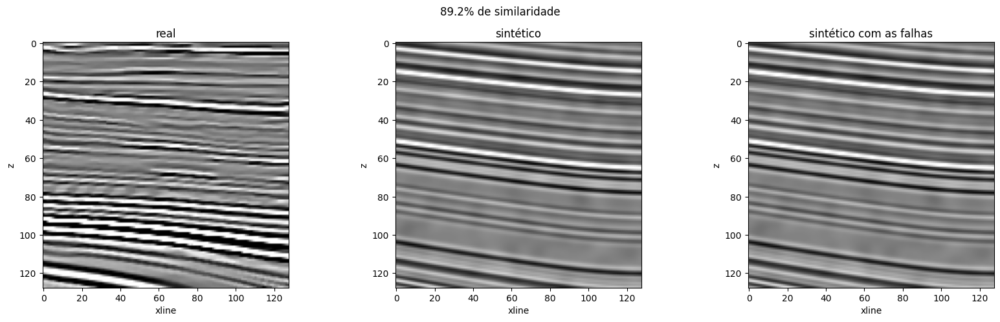

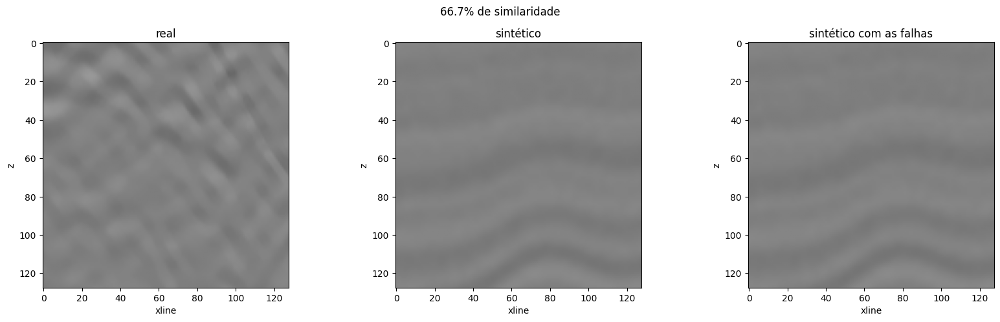

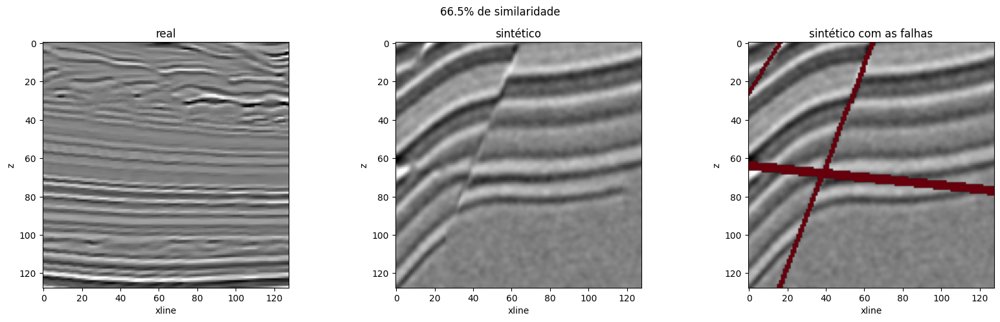

In [6]:
REFERENCE = {
    'calm': {
        'layerLow': 69,
        'layerSpan': 54,
        'thickLow': 1,
        'thickSpan': 1,
        'foldLow': 42,
        'foldSpan': 35,
        'foldSigmaLow': 34.95287,
        'foldSigmaSpan': 31.02391,
        'foldAmpLow': -21.71672,
        'foldAmpSpan': 1.4896,
        'foldDamping': 0.2,
        'shearLow': -0.0955,
        'shearSpan': 0.3763,
        'faultLow': 0,
        'faultSpan': 1,
        'freqLow': 61.95206,
        'freqSpan': 285.31752,
        'duration': 0.095,
        'noiseLow': 0.05,
        'noiseSpan': 0.15,
        'noiseSmooth': 3.0,
        'noiseInline': 2.0,
        'gainJitter': 0.26
    },
    'faulted': {
        'layerLow': 65,
        'layerSpan': 24,
        'thickLow': 6,
        'thickSpan': 9,
        'foldLow': 23,
        'foldSpan': 13,
        'foldSigmaLow': 7.82473,
        'foldSigmaSpan': 50.19,
        'foldAmpLow': -10.07881,
        'foldAmpSpan': 15.6538,
        'foldDamping': 3.9936,
        'shearLow': -0.3546,
        'shearSpan': 0.7,
        'faultLow': 3,
        'faultSpan': 3,
        'freqLow': 38.48694,
        'freqSpan': 56.08668,
        'duration': 0.24,
        'noiseLow': 0.0374,
        'noiseSpan': 0.1449,
        'noiseSmooth': 1.0,
        'noiseInline': 1.0,
        'gainJitter': 0.26
    },
    'dead': {
        'layerLow': 420,
        'layerSpan': 264,
        'thickLow': 7,
        'thickSpan': 1,
        'foldLow': 35,
        'foldSpan': 35,
        'foldSigmaLow': 20.71,
        'foldSigmaSpan': 5.18,
        'foldAmpLow': 3.24,
        'foldAmpSpan': 44.44,
        'foldDamping': 2.9344,
        'shearLow': -0.3078,
        'shearSpan': 0.7,
        'faultLow': 0,
        'faultSpan': 1,
        'freqLow': 32.98,
        'freqSpan': 1.67,
        'duration': 0.0257,
        'noiseLow': 0.12,
        'noiseSpan': 0.28,
        'noiseSmooth': 2.0,
        'noiseInline': 1.0,
        'gainJitter': 0.35
    }
}


# AS OPÇÕES DO SyntheticGenerator PARA UM GENOMA DA REGIÃO, JÁ COM O GANHO, O JITTER E A SATURAÇÃO
def getParams(region, genome):
    pair = lambda low, span: (genome[low], genome[low] + genome[span])

    return {
        'layerRange': pair('layerLow', 'layerSpan'),
        'layerThickness': pair('thickLow', 'thickSpan'),
        'foldCount': pair('foldLow', 'foldSpan'),
        'foldSigma': pair('foldSigmaLow', 'foldSigmaSpan'),
        'foldAmplitude': pair('foldAmpLow', 'foldAmpSpan'),
        'foldDamping': genome['foldDamping'],
        'shearGradient': pair('shearLow', 'shearSpan'),
        'faultCount': pair('faultLow', 'faultSpan'),
        'waveletFreq': pair('freqLow', 'freqSpan'),
        'waveletDuration': genome['duration'],
        'noiseLevel': pair('noiseLow', 'noiseSpan'),
        'noiseSigma': (genome['noiseInline'], genome['noiseSmooth'], genome['noiseSmooth']),
        'gain': 2 * CLIP * float(SIGMA[region]),
        'gainJitter': genome['gainJitter'],
        'clip': CLIP
    }


# UM TILE NA ESCALA E NOS EIXOS DO REAL, COM A MÁSCARA
def getTile(params, seed, jitter=1.0):
    waitCool()
    np.random.seed(seed)
    generator = SyntheticGenerator()
    generator.set(params)
    image, mask = generator.get()
    return (np.transpose(generator.applyGain(image, jitter), (0, 2, 1)) + CLIP) / (2 * CLIP), np.transpose(mask, (0, 2, 1))


with getPool() as pool:
    tiles = pool.starmap(getTile, [(getParams(region, REFERENCE[region]), SEED) for region in REGIONS])

for region, (image, mask) in zip(REGIONS, tiles):
    similarity.plot(np.load(marlim[region][0]), image, mask)

# ALGORITMO OTIMIZADOR
- **CMA-ES** (`NatureSelector('genetic')`): a cada geração reaprende a média, o passo e a covariância da nuvem a partir dos melhores indivíduos
- O passo inicial do CMA-ES é um escalar só, então as variáveis entram **normalizadas em [0, 1]** dentro da caixa da região; sem isso a escala de `layerLow` (centenas) engoliria a de `noiseLow` (décimos) e as variáveis pequenas ficariam batendo na borda
- A caixa é uma vizinhança da `REFERENCE` com meia-largura `SPREAD` da faixa global, no mínimo ±1 nas inteiras: nos gráficos de variável, 0 e 1 são as bordas dela, e um gene grudado nelas pede `SPREAD` maior ou a `REFERENCE` recentrada no genoma vencedor das `MÉTRICAS FINAIS`
- A geração inteira vira um lote só de `POPULATION × N_IMAGES` tiles em `WORKERS` processos (`backend='vector'`), sem pool dentro de pool, o que mantém memória e CPU no teto de `WORKERS`
- `memory` grava o estado a cada geração: interromper e rodar a célula de novo retoma de onde parou. Uma campanha terminada só é carregada, a menos que `EXTEND = True`, que roda mais `GENERATIONS` gerações a partir dela. A pasta leva a assinatura da caixa, das sementes e do lote, então mudar qualquer um deles abre campanha nova

In [7]:
BOUNDS = {
    'layerLow': {'bounds': (10, 500), 'type': 'int'},     # CAMADAS NA COLUNA
    'layerSpan': {'bounds': (1, 300), 'type': 'int'},
    'thickLow': {'bounds': (1, 12), 'type': 'int'},       # ESPESSURA DA CAMADA EM VOXELS
    'thickSpan': {'bounds': (1, 12), 'type': 'int'},
    'foldLow': {'bounds': (2, 60), 'type': 'int'},        # GAUSSIANAS DE DOBRA
    'foldSpan': {'bounds': (1, 40), 'type': 'int'},
    'foldSigmaLow': {'bounds': (3.0, 80.0)},              # LARGURA DA DOBRA
    'foldSigmaSpan': {'bounds': (1.0, 70.0)},
    'foldAmpLow': {'bounds': (-50.0, 40.0)},              # ALTURA DA DOBRA
    'foldAmpSpan': {'bounds': (0.0, 60.0)},
    'foldDamping': {'bounds': (0.2, 6.0)},                # CRESCIMENTO DA DOBRA COM A PROFUNDIDADE
    'shearLow': {'bounds': (-0.5, 0.2)},                  # MERGULHO REGIONAL
    'shearSpan': {'bounds': (0.0, 0.7)},
    'faultLow': {'bounds': (0, 3), 'type': 'int'},        # FALHAS POR TILE, TETO EXCLUSIVO
    'faultSpan': {'bounds': (1, 3), 'type': 'int'},
    'freqLow': {'bounds': (25.0, 333.0)},                 # FREQUÊNCIA DO RICKER NA ESCALA DO waveletDt = 0.0012
    'freqSpan': {'bounds': (0.0, 300.0)},
    'duration': {'bounds': (0.018, 0.240)},               # MEIA-DURAÇÃO DA WAVELET
    'noiseLow': {'bounds': (0.0, 0.40)},                  # RUÍDO QUE QUEBRA A COERÊNCIA DO REFLETOR
    'noiseSpan': {'bounds': (0.0, 0.60)},
    'noiseSmooth': {'bounds': (0.4, 5.0)},                # GRÃO DO RUÍDO NA SEÇÃO (z, xline)
    'noiseInline': {'bounds': (0.4, 5.0)},                # GRÃO DO RUÍDO AO LONGO DAS INLINES
    'gainJitter': {'bounds': (0.0, 1.0)}                  # CONTRASTE ENTRE TILES: O σ DO faulted REAL VARIA 5X
}

SPREAD      = 0.3
POPULATION  = 16
GENERATIONS = 60
PATIENCE    = 15
EXTEND      = False    # True RODA MAIS GENERATIONS NUMA CAMPANHA JÁ TERMINADA
Memory.EVERY = 1  # CHECKPOINT A CADA GERAÇÃO: UMA GERAÇÃO CUSTA MINUTOS


# VIZINHANÇA DA REFERÊNCIA: MEIA-LARGURA SPREAD DA FAIXA GLOBAL, NO MÍNIMO ±1 NAS INTEIRAS
def getBox(region):
    box = {}

    for name, spec in BOUNDS.items():
        low, high = spec['bounds']
        half      = max(SPREAD * (high - low), 1 if spec.get('type') == 'int' else 0)
        box[name] = (max(low, REFERENCE[region][name] - half), min(high, REFERENCE[region][name] + half))

    return box


def decode(region, u):
    genome = {name: low + value * (high - low) for (name, (low, high)), value in zip(BOX[region].items(), u)}
    return {name: int(round(value)) if BOUNDS[name].get('type') == 'int' else float(value) for name, value in genome.items()}


# AS TAREFAS DE UM LOTE: SEMENTE E JITTER DE CADA TILE, NA MESMA REGRA DO SyntheticGenerator.dataset()
def getTasks(params, seed, n):
    generator = SyntheticGenerator()
    generator.set(params)
    return [(params, seed + i, jitter) for i, jitter in enumerate(generator.getJitter(n, seed))]

def getTileFeatures(task):
    image, mask = getTile(*task)
    return {**similarity.getFeatures(image), 'sigma': float(image.std()), 'label': float(mask.mean())}

def getMemory(region):
    return f'files/memory/{region}_{hashlib.md5(json.dumps([BOX[region], N_IMAGES[region], SEED]).encode()).hexdigest()[:8]}'


# CAMPANHA TERMINADA SÓ É CARREGADA: RODAR O NOTEBOOK DE NOVO NÃO REFAZ HORAS DE BUSCA
def getGenerations(region):
    return GENERATIONS if EXTEND or not os.path.exists(f'{getMemory(region)}/best.json') else 0

# A NOTA DE CADA INDIVÍDUO DA POPULAÇÃO: TODOS OS TILES DA GERAÇÃO NUM POOL SÓ
def objective(X, region):
    n     = N_IMAGES[region]
    tasks = [task for u in X for task in getTasks(getParams(region, decode(region, u)), SEED, n)]

    with getPool() as pool:
        rows = pool.map(getTileFeatures, tasks, chunksize=1)

    return [similarity.getScore(similarity.real[region], pd.DataFrame(rows[k:k + n])) for k in range(0, len(rows), n)]

BOX   = {region: getBox(region) for region in REGIONS}
SPACE = {name: {'bounds': (0.0, 1.0)} for name in BOUNDS}

pd.DataFrame({region: {name: f'{low:.4g} a {high:.4g}' for name, (low, high) in box.items()} for region, box in BOX.items()})

,calm,dead,faulted
layerLow,10 a 216,273 a 500,10 a 212
layerSpan,1 a 143.7,174.3 a 300,1 a 113.7
thickLow,1 a 4.3,3.7 a 10.3,2.7 a 9.3
thickSpan,1 a 4.3,1 a 4.3,5.7 a 12
foldLow,24.6 a 59.4,17.6 a 52.4,5.6 a 40.4
foldSpan,23.3 a 40,23.3 a 40,1.3 a 24.7
foldSigmaLow,11.85 a 58.05,3 a 43.81,3 a 30.92
foldSigmaSpan,10.32 a 51.72,1 a 25.88,29.49 a 70
foldAmpLow,-48.72 a 5.283,-23.76 a 30.24,-37.08 a 16.92
foldAmpSpan,0 a 19.49,26.44 a 60,0 a 33.65


# OTIMIZAÇÃO - REGIÃO CALM
- Pacote raso: refletores finos, contínuos e quase deitados, sem falha anotada por perto

genetic: 0ev [00:00, ?ev/s]

genetic: 0ev [00:00, ?ev/s]

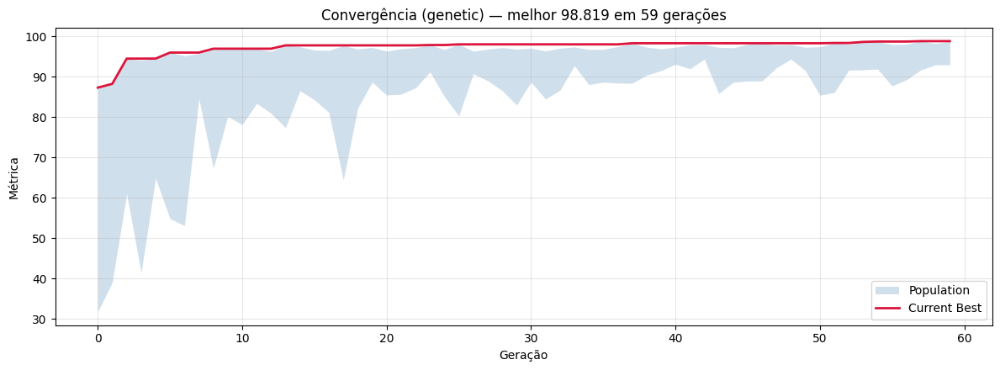

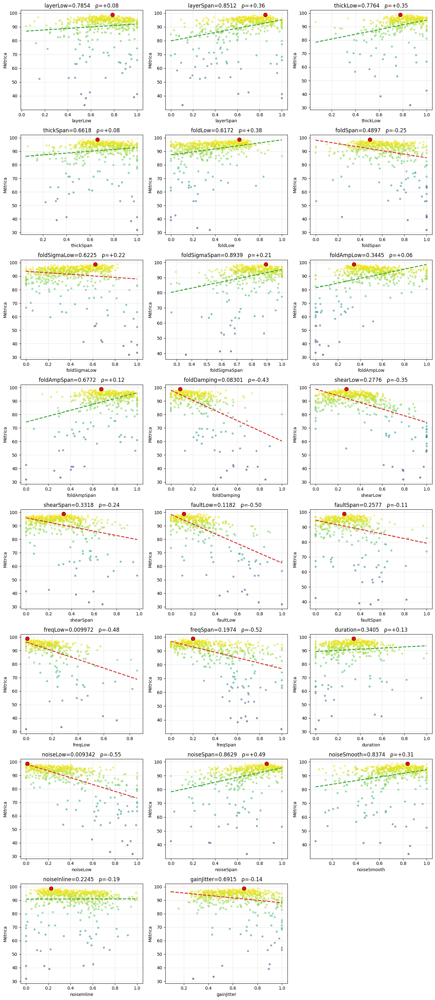

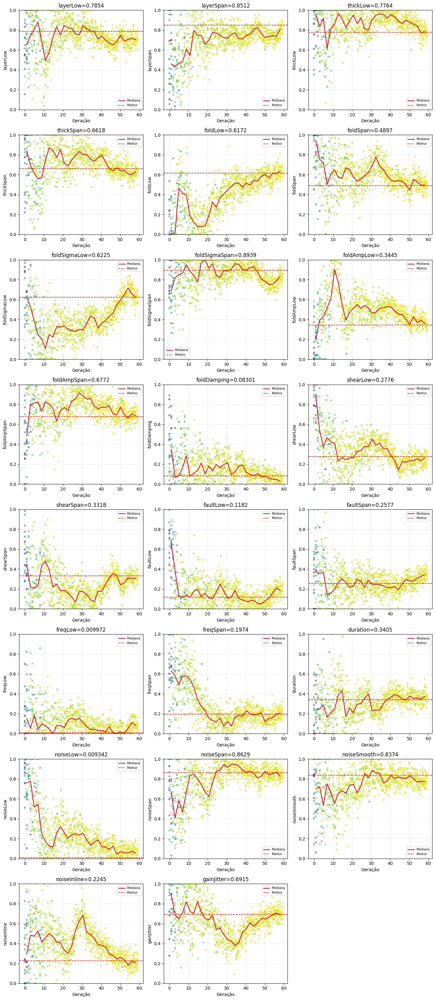

In [8]:
problem = {
    'objective': lambda X: objective(X, 'calm'), 'maximize': True, 'seed': 42, 'verbose': True, 'backend': 'vector',
    'variables': SPACE
}

calm = NatureSelector('genetic', {**problem, 'population': POPULATION, 'generations': getGenerations('calm'), 'patience': PATIENCE}, memory=getMemory('calm'))
best, score = calm.update()

calm.plotMetrics()
calm.plotVariables('range')
calm.plotVariables('temporal')

# OTIMIZAÇÃO - REGIÃO DEAD
- Zona morta: amplitude ~12x menor que a do pacote raso e quase sem refletor coerente; a coerência que o gerador alcança é o limite conhecido dessa região

genetic:   0%|          | 0/960 [00:00<?, ?ev/s]

genetic:   2%|▏         | 16/960 [04:01<3:57:45, 15.11s/ev]

genetic:   3%|▎         | 32/960 [08:39<4:14:04, 16.43s/ev, best=86.8401, pop=16]

genetic:   5%|▌         | 48/960 [12:35<3:57:54, 15.65s/ev, best=88.1537, pop=16]

genetic:   7%|▋         | 64/960 [16:59<3:58:50, 15.99s/ev, best=89.1391, pop=16]

genetic:   8%|▊         | 80/960 [21:21<3:56:37, 16.13s/ev, best=89.1391, pop=16]

genetic:  10%|█         | 96/960 [25:32<3:50:11, 15.99s/ev, best=89.1391, pop=16]

genetic:  12%|█▏        | 112/960 [29:48<3:45:58, 15.99s/ev, best=89.917, pop=16]

genetic:  13%|█▎        | 128/960 [34:14<3:44:27, 16.19s/ev, best=89.917, pop=16]

genetic:  15%|█▌        | 144/960 [38:38<3:41:38, 16.30s/ev, best=90.7129, pop=16]

genetic:  17%|█▋        | 160/960 [42:58<3:37:01, 16.28s/ev, best=90.7129, pop=16]

genetic:  18%|█▊        | 176/960 [47:19<3:32:49, 16.29s/ev, best=90.7129, pop=16]

genetic:  20%|██        | 192/960 [51:40<3:28:31, 16.29s/ev, best=90.7129, pop=16]

genetic:  22%|██▏       | 208/960 [56:05<3:25:17, 16.38s/ev, best=90.7129, pop=16]

genetic:  23%|██▎       | 224/960 [1:00:32<3:21:59, 16.47s/ev, best=90.7129, pop=16]

genetic:  25%|██▌       | 240/960 [1:05:08<3:20:20, 16.70s/ev, best=90.7129, pop=16]

genetic:  27%|██▋       | 256/960 [1:10:10<3:23:40, 17.36s/ev, best=91.4779, pop=16]

genetic:  28%|██▊       | 272/960 [1:15:12<3:24:16, 17.81s/ev, best=92.0054, pop=16]

genetic:  30%|███       | 288/960 [1:20:12<3:22:39, 18.09s/ev, best=92.0054, pop=16]

genetic:  32%|███▏      | 304/960 [1:25:56<3:29:07, 19.13s/ev, best=92.0054, pop=16]

genetic:  33%|███▎      | 320/960 [1:31:48<3:33:13, 19.99s/ev, best=92.0054, pop=16]

genetic:  35%|███▌      | 336/960 [1:37:58<3:37:37, 20.93s/ev, best=93.028, pop=16] 

genetic:  37%|███▋      | 352/960 [1:45:26<3:53:27, 23.04s/ev, best=93.028, pop=16]

genetic:  38%|███▊      | 368/960 [1:53:01<4:03:27, 24.68s/ev, best=93.028, pop=16]

genetic:  40%|████      | 384/960 [2:00:35<4:07:23, 25.77s/ev, best=93.028, pop=16]

genetic:  42%|████▏     | 400/960 [2:07:35<4:01:55, 25.92s/ev, best=93.028, pop=16]

genetic:  43%|████▎     | 416/960 [2:16:41<4:17:23, 28.39s/ev, best=93.028, pop=16]

genetic:  45%|████▌     | 432/960 [2:24:25<4:11:21, 28.56s/ev, best=93.2362, pop=16]

genetic:  47%|████▋     | 448/960 [2:31:50<4:01:46, 28.33s/ev, best=93.2362, pop=16]

genetic:  48%|████▊     | 464/960 [2:38:55<3:49:56, 27.81s/ev, best=93.2362, pop=16]

genetic:  50%|█████     | 480/960 [2:46:37<3:45:05, 28.14s/ev, best=93.2362, pop=16]

genetic:  52%|█████▏    | 496/960 [2:54:00<3:36:27, 27.99s/ev, best=93.2362, pop=16]

genetic:  53%|█████▎    | 512/960 [3:02:47<3:40:03, 29.47s/ev, best=93.2362, pop=16]

genetic:  55%|█████▌    | 528/960 [3:11:14<3:36:59, 30.14s/ev, best=93.2362, pop=16]

genetic:  57%|█████▋    | 544/960 [3:18:48<3:25:22, 29.62s/ev, best=93.3674, pop=16]

genetic:  58%|█████▊    | 560/960 [3:26:17<3:14:20, 29.15s/ev, best=93.3674, pop=16]

genetic:  60%|██████    | 576/960 [3:34:13<3:07:42, 29.33s/ev, best=93.3674, pop=16]

genetic:  62%|██████▏   | 592/960 [3:41:49<2:58:17, 29.07s/ev, best=93.3674, pop=16]

genetic:  63%|██████▎   | 608/960 [3:48:53<2:46:02, 28.30s/ev, best=93.3674, pop=16]

genetic:  65%|██████▌   | 624/960 [3:57:24<2:44:37, 29.40s/ev, best=93.3674, pop=16]

genetic:  67%|██████▋   | 640/960 [4:06:12<2:42:29, 30.47s/ev, best=93.3674, pop=16]

genetic:  68%|██████▊   | 656/960 [4:14:16<2:34:07, 30.42s/ev, best=93.3674, pop=16]

genetic:  70%|███████   | 672/960 [4:20:57<2:18:17, 28.81s/ev, best=93.3674, pop=16]

genetic:  72%|███████▏  | 688/960 [4:28:17<2:08:48, 28.41s/ev, best=93.3674, pop=16]

genetic:  73%|███████▎  | 704/960 [4:36:11<2:02:47, 28.78s/ev, best=93.3674, pop=16]

genetic:  75%|███████▌  | 720/960 [4:43:51<1:55:02, 28.76s/ev, best=93.3674, pop=16]

genetic:  77%|███████▋  | 736/960 [4:52:04<1:49:39, 29.37s/ev, best=93.3674, pop=16]

genetic:  78%|███████▊  | 752/960 [5:01:13<1:46:58, 30.86s/ev, best=93.3674, pop=16]

genetic:  80%|████████  | 768/960 [5:09:30<1:38:58, 30.93s/ev, best=93.3674, pop=16]

genetic: 100%|██████████| 768/768 [5:09:30<00:00, 24.18s/ev, best=93.3674, pop=16]  

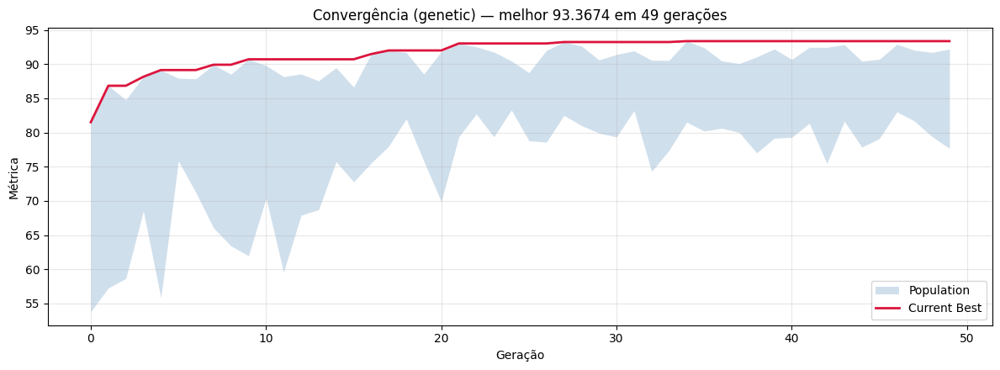

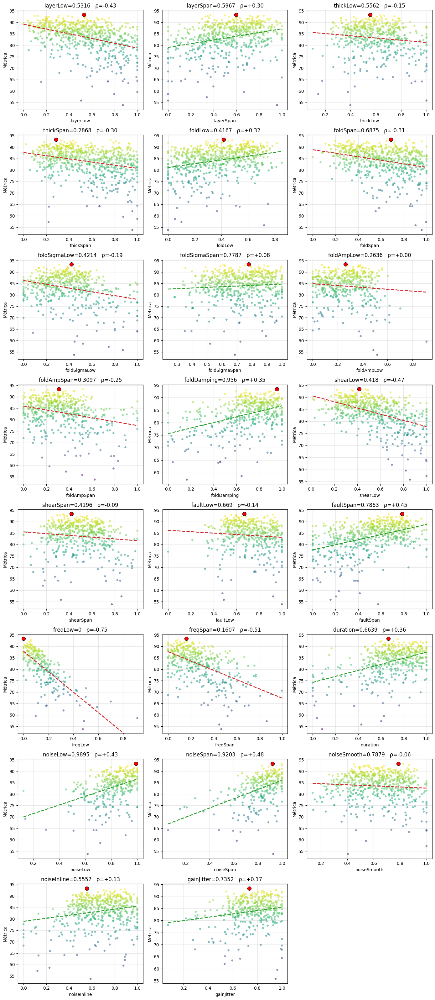

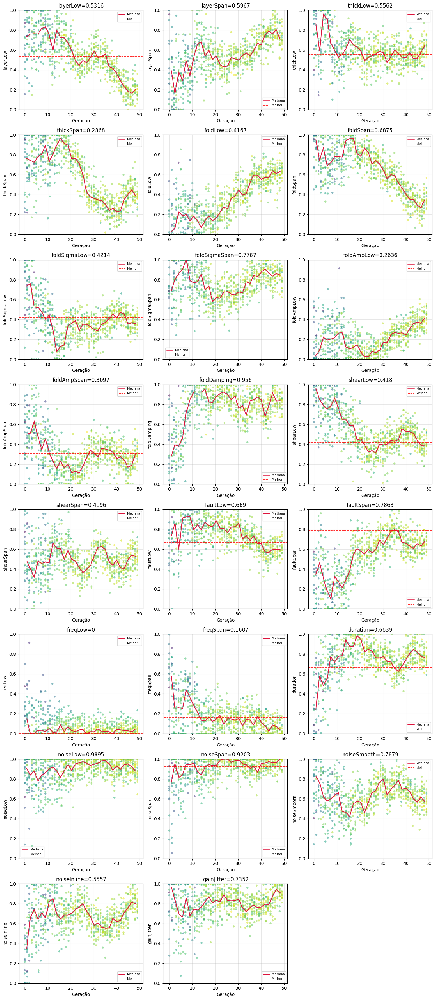

In [9]:
problem = {
    'objective': lambda X: objective(X, 'dead'), 'maximize': True, 'seed': 42, 'verbose': True, 'backend': 'vector',
    'variables': SPACE
}

dead = NatureSelector('genetic', {**problem, 'population': POPULATION, 'generations': getGenerations('dead'), 'patience': PATIENCE}, memory=getMemory('dead'))
best, score = dead.update()

dead.plotMetrics()
dead.plotVariables('range')
dead.plotVariables('temporal')

# OTIMIZAÇÃO - REGIÃO FAULTED
- Intervalo produtivo: refletores de frequência mais baixa cortados por falhas de mergulho alto, onde o grupo `falhas` pesa mais na nota

genetic:   0%|          | 0/960 [00:00<?, ?ev/s]

genetic:   2%|▏         | 16/960 [16:57<16:40:59, 63.62s/ev]

genetic:   3%|▎         | 32/960 [25:07<11:23:35, 44.20s/ev, best=93.148, pop=16]

genetic:   5%|▌         | 48/960 [33:14<9:36:06, 37.90s/ev, best=93.148, pop=16] 

genetic:   7%|▋         | 64/960 [41:09<8:37:38, 34.66s/ev, best=93.8157, pop=16]

genetic:   8%|▊         | 80/960 [50:12<8:24:45, 34.42s/ev, best=93.8157, pop=16]

genetic:  10%|█         | 96/960 [59:10<8:11:28, 34.13s/ev, best=93.8157, pop=16]

genetic:  12%|█▏        | 112/960 [1:07:39<7:51:38, 33.37s/ev, best=93.8157, pop=16]

genetic:  13%|█▎        | 128/960 [1:15:55<7:32:31, 32.63s/ev, best=93.8157, pop=16]

genetic:  15%|█▌        | 144/960 [1:24:02<7:14:16, 31.93s/ev, best=93.8157, pop=16]

genetic:  17%|█▋        | 160/960 [1:31:42<6:52:40, 30.95s/ev, best=93.8157, pop=16]

genetic:  18%|█▊        | 176/960 [1:38:45<6:26:24, 29.57s/ev, best=95.88, pop=16]  

genetic:  20%|██        | 192/960 [1:46:50<6:21:27, 29.80s/ev, best=95.88, pop=16]

genetic:  22%|██▏       | 208/960 [1:55:08<6:18:35, 30.21s/ev, best=95.88, pop=16]

genetic:  23%|██▎       | 224/960 [2:02:36<6:02:11, 29.53s/ev, best=95.88, pop=16]

genetic:  25%|██▌       | 240/960 [2:09:40<5:43:34, 28.63s/ev, best=95.88, pop=16]

genetic:  27%|██▋       | 256/960 [2:17:17<5:35:37, 28.60s/ev, best=97.0419, pop=16]

genetic:  28%|██▊       | 272/960 [2:25:02<5:29:31, 28.74s/ev, best=97.0419, pop=16]

genetic:  30%|███       | 288/960 [2:32:57<5:25:09, 29.03s/ev, best=97.0419, pop=16]

genetic:  32%|███▏      | 304/960 [2:40:59<5:20:53, 29.35s/ev, best=97.0419, pop=16]

genetic:  33%|███▎      | 320/960 [2:48:39<5:11:14, 29.18s/ev, best=97.0419, pop=16]

genetic:  35%|███▌      | 336/960 [2:56:21<5:02:28, 29.08s/ev, best=97.0419, pop=16]

genetic:  37%|███▋      | 352/960 [3:04:03<4:54:05, 29.02s/ev, best=97.0419, pop=16]

genetic:  38%|███▊      | 368/960 [3:10:41<4:34:04, 27.78s/ev, best=97.7393, pop=16]

genetic:  40%|████      | 384/960 [3:17:51<4:23:57, 27.50s/ev, best=97.7393, pop=16]

genetic:  42%|████▏     | 400/960 [3:24:57<4:14:19, 27.25s/ev, best=97.7393, pop=16]

genetic:  43%|████▎     | 416/960 [3:32:50<4:13:19, 27.94s/ev, best=97.7393, pop=16]

genetic:  45%|████▌     | 432/960 [3:39:44<4:00:26, 27.32s/ev, best=97.7393, pop=16]

genetic:  47%|████▋     | 448/960 [3:47:13<3:54:55, 27.53s/ev, best=97.7393, pop=16]

genetic:  48%|████▊     | 464/960 [3:53:55<3:41:39, 26.81s/ev, best=97.7393, pop=16]

genetic:  50%|█████     | 480/960 [4:01:04<3:34:34, 26.82s/ev, best=97.7393, pop=16]

genetic:  52%|█████▏    | 496/960 [4:06:15<3:10:13, 24.60s/ev, best=97.7393, pop=16]

genetic:  53%|█████▎    | 512/960 [4:11:33<2:53:08, 23.19s/ev, best=97.7393, pop=16]

genetic:  55%|█████▌    | 528/960 [4:16:34<2:37:26, 21.87s/ev, best=97.7393, pop=16]

genetic:  57%|█████▋    | 544/960 [4:21:47<2:26:54, 21.19s/ev, best=97.7393, pop=16]

genetic:  58%|█████▊    | 560/960 [4:26:42<2:15:43, 20.36s/ev, best=97.7393, pop=16]

genetic:  60%|██████    | 576/960 [4:31:36<2:06:29, 19.76s/ev, best=97.7393, pop=16]

genetic:  62%|██████▏   | 592/960 [4:36:32<1:58:49, 19.37s/ev, best=97.7393, pop=16]

genetic: 100%|██████████| 592/592 [4:36:32<00:00, 28.03s/ev, best=97.7393, pop=16]  

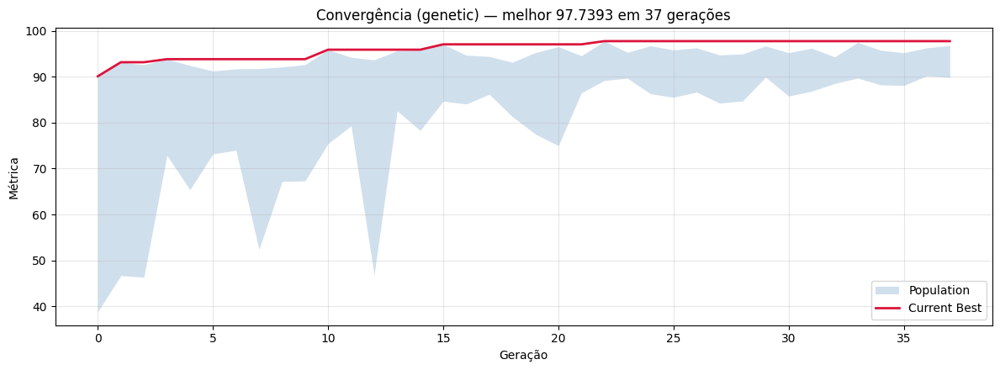

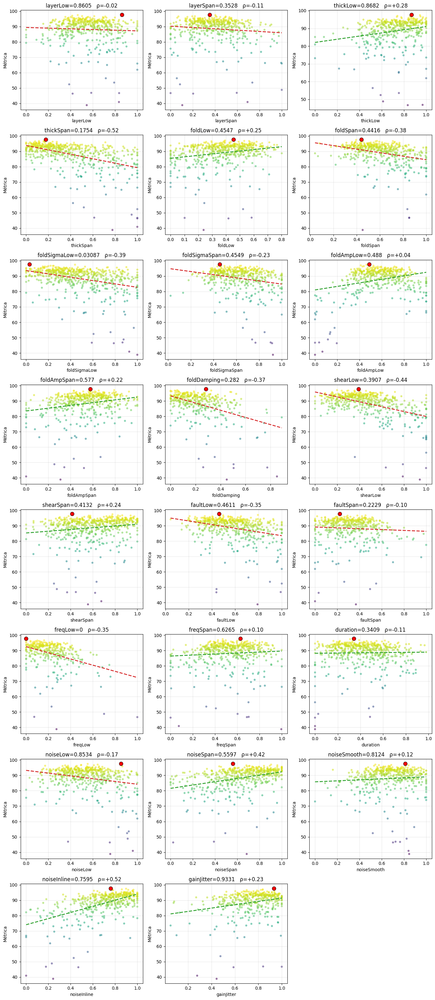

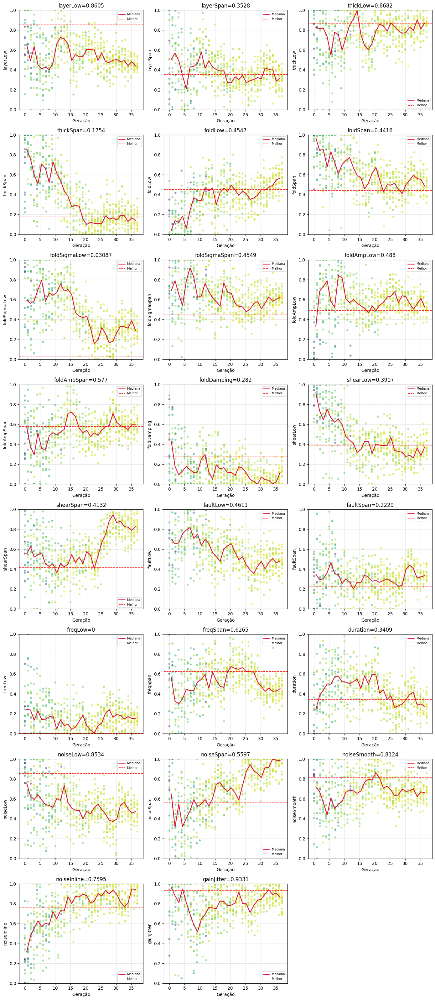

In [10]:
problem = {
    'objective': lambda X: objective(X, 'faulted'), 'maximize': True, 'seed': 42, 'verbose': True, 'backend': 'vector',
    'variables': SPACE
}

faulted = NatureSelector('genetic', {**problem, 'population': POPULATION, 'generations': getGenerations('faulted'), 'patience': PATIENCE}, memory=getMemory('faulted'))
best, score = faulted.update()

faulted.plotMetrics()
faulted.plotVariables('range')
faulted.plotVariables('temporal')

# MÉTRICAS FINAIS
- A busca otimiza sempre as mesmas sementes e acaba aprendendo os defeitos delas, então a nota que vale é medida em **sementes novas** (`CHECK_SEED`) e num lote maior (`N_CHECK` tiles)
- Fica a melhor entre a busca e a `REFERENCE`: rodar tudo de novo nunca piora uma região
- `sigma` e `rótulo` são o σ mediano do tile e a fração de voxels marcados como falha
- A segunda tabela é o genoma que ficou em cada região: copiado para a `REFERENCE`, a próxima campanha passa a explorar em volta dele

In [11]:
N_CHECK    = 36
CHECK_SEED = SEED + 1000


def getCheck(region, genome):
    with getPool() as pool:
        return pd.DataFrame(pool.map(getTileFeatures, getTasks(getParams(region, genome), CHECK_SEED, N_CHECK), chunksize=1))


selectors = {'calm': calm, 'dead': dead, 'faulted': faulted}
results   = []

for region, selector in selectors.items():
    for name, genome in {'busca': decode(region, list(selector.best.values())), 'referência': REFERENCE[region]}.items():
        table = getCheck(region, genome)
        row   = {'região': region, 'candidato': name, 'nota': similarity.getScore(similarity.real[region], table), 'nota na busca': selector.score if name == 'busca' else np.nan}
        results.append({**row, 'sigma': table.sigma.median(), 'sigma real': SIGMA[region], 'rótulo': table.label.mean(), 'genome': genome, **similarity.getGroups(similarity.real[region], table)})

results = pd.DataFrame(results)
winners = results.loc[results.groupby('região', sort=False).nota.idxmax()]

REGIONS_OPTIMIZED = {row['região']: getParams(row['região'], row.genome) for _, row in winners.iterrows()}
display(results.drop(columns='genome').round(4))
pd.DataFrame({row['região']: pd.Series(row.genome, dtype=object) for _, row in winners.iterrows()})

,região,candidato,nota,nota na busca,sigma,sigma real,rótulo,amplitude,espectro,estrutura,continuidade,falhas
0,calm,busca,96.4917,98.8190,0.1889,0.1921,0.0000,99.3724,96.3304,97.3052,98.6015,93.6394
1,calm,referência,88.8866,NaN,0.1897,0.1921,0.0000,97.2796,85.4759,85.6714,81.5713,93.3016
2,dead,busca,88.2525,93.3674,0.0161,0.0161,0.0175,85.2466,89.2311,91.9613,96.2807,83.0298
3,dead,referência,79.6040,NaN,0.0161,0.0161,0.0000,89.2233,94.1240,67.5029,91.3576,70.0631
4,faulted,busca,94.1094,97.7393,0.1457,0.1457,0.0251,94.6151,91.7448,98.1498,93.6124,93.0713
5,faulted,referência,92.7858,NaN,0.1455,0.1457,0.0429,90.4526,94.5487,94.5340,98.5753,88.9230


,calm,dead,faulted
layerLow,172,394,184
layerSpan,122,249,41
thickLow,4,7,8
thickSpan,3,2,7
foldLow,46,32,21
foldSpan,31,35,12
foldSigmaLow,40.610836,20.199249,3.861946
foldSigmaSpan,47.332935,20.374534,47.917805
foldAmpLow,-30.116322,-9.525229,-10.727815
foldAmpSpan,13.197487,36.834817,19.417668


# GERANDO OS DADOS SINTETICOS NOVOS
- `SyntheticGenerator.dataset()` grava `PER_REGION` tiles de cada região em `original/<região>/{images,masks}`, crus e saturados em ±`CLIP`, com o ganho e o jitter da região
- O índice dos arquivos é global (`img_0000` a `img_0659`), então o `Format.ipynb` junta as três regiões em `images/` e `masks/` sem colisão
- `synthetic.json` guarda as opções inteiras com a semente: é o que reproduz o dataset e de onde o `Format.ipynb` tira os trilhos ±`CLIP`
- A tabela relê os arquivos gravados e mede de novo a nota, o σ e o rótulo de cada região

In [12]:
def getFileFeatures(paths):
    image = (np.load(paths[0]) + CLIP) / (2 * CLIP)
    return {**similarity.getFeatures(image), 'sigma': float(image.std()), 'label': float(np.load(paths[1]).mean())}

In [13]:
DATASET  = '../../../Dataset/dataset_regions'

options = {
    'directory': DATASET,
    'seed': SEED + 2000,
    'regions': {region: {'n_images': 220, 'output': f'original/{region}', 'params': params} for region, params in REGIONS_OPTIMIZED.items()}
}

SyntheticGenerator().dataset(options, n_jobs=WORKERS)
json.dump(options, open(f'{DATASET}/synthetic.json', 'w'), ensure_ascii=False, indent=4)
saved = {}

for region in REGIONS:
    with getPool() as pool:
        table = pd.DataFrame(pool.map(getFileFeatures, list(zip(getFiles(f'{DATASET}/original/{region}/images'), getFiles(f'{DATASET}/original/{region}/masks'))), chunksize=4))

    saved[region] = {'tiles': len(table), 'nota': similarity.getScore(similarity.real[region], table), 'sigma': table.sigma.median(), 'sigma real': SIGMA[region], 'rótulo': table.label.mean()}

pd.DataFrame(saved).T.round(4)

calm:   0%|          | 0/220 [00:00<?, ?it/s]

calm:   0%|          | 1/220 [00:06<22:02,  6.04s/it]

calm:   3%|▎         | 7/220 [00:09<03:58,  1.12s/it]

calm:   5%|▍         | 10/220 [00:10<03:05,  1.13it/s]

calm:   6%|▌         | 13/220 [00:13<02:57,  1.16it/s]

calm:   6%|▋         | 14/220 [00:13<02:42,  1.27it/s]

calm:   7%|▋         | 15/220 [00:14<02:53,  1.18it/s]

calm:   8%|▊         | 17/220 [00:15<02:06,  1.61it/s]

calm:   9%|▊         | 19/220 [00:18<03:26,  1.03s/it]

calm:  10%|█         | 22/220 [00:19<02:24,  1.37it/s]

calm:  11%|█▏        | 25/220 [00:21<02:18,  1.41it/s]

calm:  12%|█▏        | 26/220 [00:22<02:13,  1.46it/s]

calm:  12%|█▏        | 27/220 [00:23<02:31,  1.28it/s]

calm:  13%|█▎        | 29/220 [00:23<01:47,  1.77it/s]

calm:  14%|█▍        | 31/220 [00:27<02:59,  1.06it/s]

calm:  15%|█▌        | 34/220 [00:27<01:54,  1.62it/s]

calm:  16%|█▌        | 35/220 [00:27<01:38,  1.87it/s]

calm:  16%|█▋        | 36/220 [00:28<01:40,  1.82it/s]

calm:  17%|█▋        | 37/220 [00:30<02:37,  1.16it/s]

calm:  17%|█▋        | 38/220 [00:31<02:47,  1.09it/s]

calm:  18%|█▊        | 40/220 [00:32<02:07,  1.41it/s]

calm:  19%|█▉        | 42/220 [00:32<01:24,  2.11it/s]

calm:  20%|█▉        | 43/220 [00:34<02:28,  1.19it/s]

calm:  20%|██        | 44/220 [00:35<02:21,  1.24it/s]

calm:  20%|██        | 45/220 [00:36<02:15,  1.29it/s]

calm:  21%|██        | 46/220 [00:36<01:49,  1.59it/s]

calm:  21%|██▏       | 47/220 [00:36<01:26,  2.00it/s]

calm:  22%|██▏       | 48/220 [00:36<01:08,  2.52it/s]

calm:  22%|██▏       | 49/220 [00:39<03:07,  1.09s/it]

calm:  23%|██▎       | 51/220 [00:40<02:09,  1.31it/s]

calm:  24%|██▎       | 52/220 [00:42<02:59,  1.07s/it]

calm:  25%|██▌       | 55/220 [00:43<01:58,  1.39it/s]

calm:  26%|██▌       | 57/220 [00:44<01:45,  1.54it/s]

calm:  26%|██▋       | 58/220 [00:45<02:10,  1.24it/s]

calm:  27%|██▋       | 60/220 [00:46<01:45,  1.52it/s]

calm:  28%|██▊       | 61/220 [00:47<01:52,  1.41it/s]

calm:  29%|██▊       | 63/220 [00:49<02:09,  1.21it/s]

calm:  29%|██▉       | 64/220 [00:50<01:55,  1.35it/s]

calm:  30%|██▉       | 65/220 [00:50<01:37,  1.59it/s]

calm:  30%|███       | 66/220 [00:51<02:09,  1.19it/s]

calm:  31%|███▏      | 69/220 [00:54<02:06,  1.19it/s]

calm:  32%|███▏      | 71/220 [00:54<01:33,  1.60it/s]

calm:  33%|███▎      | 72/220 [00:55<01:35,  1.55it/s]

calm:  33%|███▎      | 73/220 [00:55<01:25,  1.73it/s]

calm:  34%|███▎      | 74/220 [00:56<01:15,  1.94it/s]

calm:  34%|███▍      | 75/220 [00:59<02:50,  1.18s/it]

calm:  35%|███▌      | 78/220 [01:01<02:05,  1.13it/s]

calm:  36%|███▌      | 79/220 [01:01<01:48,  1.30it/s]

calm:  37%|███▋      | 81/220 [01:02<01:40,  1.38it/s]

calm:  37%|███▋      | 82/220 [01:03<01:41,  1.36it/s]

calm:  38%|███▊      | 83/220 [01:03<01:21,  1.69it/s]

calm:  38%|███▊      | 84/220 [01:04<01:18,  1.74it/s]

calm:  39%|███▊      | 85/220 [01:06<02:32,  1.13s/it]

calm:  40%|███▉      | 87/220 [01:08<02:04,  1.07it/s]

calm:  41%|████▏     | 91/220 [01:09<01:28,  1.46it/s]

calm:  42%|████▏     | 92/220 [01:12<01:57,  1.09it/s]

calm:  43%|████▎     | 94/220 [01:12<01:25,  1.47it/s]

calm:  44%|████▎     | 96/220 [01:13<01:13,  1.68it/s]

calm:  44%|████▍     | 97/220 [01:14<01:17,  1.59it/s]

calm:  45%|████▍     | 98/220 [01:15<01:30,  1.34it/s]

calm:  45%|████▌     | 99/220 [01:16<01:33,  1.29it/s]

calm:  45%|████▌     | 100/220 [01:17<02:03,  1.03s/it]

calm:  47%|████▋     | 103/220 [01:18<01:10,  1.66it/s]

calm:  47%|████▋     | 104/220 [01:19<01:17,  1.50it/s]

calm:  48%|████▊     | 105/220 [01:20<01:25,  1.34it/s]

calm:  48%|████▊     | 106/220 [01:21<01:25,  1.34it/s]

calm:  49%|████▊     | 107/220 [01:21<01:12,  1.56it/s]

calm:  49%|████▉     | 108/220 [01:23<01:55,  1.03s/it]

calm:  50%|█████     | 110/220 [01:24<01:22,  1.33it/s]

calm:  51%|█████     | 112/220 [01:25<01:14,  1.45it/s]

calm:  51%|█████▏    | 113/220 [01:25<01:03,  1.68it/s]

calm:  52%|█████▏    | 114/220 [01:26<01:07,  1.58it/s]

calm:  52%|█████▏    | 115/220 [01:28<01:34,  1.12it/s]

calm:  53%|█████▎    | 116/220 [01:28<01:17,  1.35it/s]

calm:  54%|█████▎    | 118/220 [01:29<01:07,  1.52it/s]

calm:  54%|█████▍    | 119/220 [01:30<01:06,  1.52it/s]

calm:  55%|█████▍    | 120/220 [01:30<01:05,  1.53it/s]

calm:  55%|█████▌    | 121/220 [01:32<01:28,  1.12it/s]

calm:  55%|█████▌    | 122/220 [01:32<01:09,  1.40it/s]

calm:  56%|█████▋    | 124/220 [01:33<00:57,  1.66it/s]

calm:  57%|█████▋    | 125/220 [01:34<01:02,  1.52it/s]

calm:  57%|█████▋    | 126/220 [01:35<01:16,  1.23it/s]

calm:  58%|█████▊    | 127/220 [01:36<01:21,  1.14it/s]

calm:  58%|█████▊    | 128/220 [01:38<01:41,  1.10s/it]

calm:  60%|█████▉    | 131/220 [01:39<00:52,  1.69it/s]

calm:  60%|██████    | 132/220 [01:39<00:54,  1.61it/s]

calm:  60%|██████    | 133/220 [01:41<01:07,  1.29it/s]

calm:  61%|██████    | 134/220 [01:41<01:05,  1.31it/s]

calm:  61%|██████▏   | 135/220 [01:42<01:13,  1.16it/s]

calm:  62%|██████▏   | 136/220 [01:43<01:10,  1.19it/s]

calm:  62%|██████▏   | 137/220 [01:44<00:57,  1.43it/s]

calm:  63%|██████▎   | 139/220 [01:45<00:50,  1.59it/s]

calm:  64%|██████▎   | 140/220 [01:46<00:58,  1.36it/s]

calm:  64%|██████▍   | 141/220 [01:47<01:02,  1.27it/s]

calm:  65%|██████▍   | 142/220 [01:48<01:06,  1.17it/s]

calm:  65%|██████▌   | 143/220 [01:49<01:17,  1.01s/it]

calm:  66%|██████▋   | 146/220 [01:50<00:42,  1.72it/s]

calm:  67%|██████▋   | 147/220 [01:51<00:49,  1.49it/s]

calm:  67%|██████▋   | 148/220 [01:52<01:01,  1.18it/s]

calm:  68%|██████▊   | 150/220 [01:53<00:52,  1.33it/s]

calm:  69%|██████▉   | 152/220 [01:54<00:38,  1.75it/s]

calm:  70%|██████▉   | 153/220 [01:55<00:47,  1.42it/s]

calm:  70%|███████   | 154/220 [01:57<01:07,  1.02s/it]

calm:  71%|███████   | 156/220 [01:58<00:48,  1.31it/s]

calm:  71%|███████▏  | 157/220 [01:58<00:41,  1.52it/s]

calm:  72%|███████▏  | 159/220 [01:59<00:34,  1.79it/s]

calm:  73%|███████▎  | 160/220 [02:00<00:41,  1.44it/s]

calm:  73%|███████▎  | 161/220 [02:02<00:51,  1.14it/s]

calm:  74%|███████▎  | 162/220 [02:02<00:46,  1.25it/s]

calm:  75%|███████▍  | 164/220 [02:02<00:28,  1.99it/s]

calm:  75%|███████▌  | 165/220 [02:03<00:28,  1.92it/s]

calm:  75%|███████▌  | 166/220 [02:05<00:42,  1.29it/s]

calm:  76%|███████▌  | 167/220 [02:06<00:46,  1.13it/s]

calm:  76%|███████▋  | 168/220 [02:07<00:44,  1.16it/s]

calm:  77%|███████▋  | 169/220 [02:07<00:34,  1.47it/s]

calm:  78%|███████▊  | 171/220 [02:07<00:23,  2.04it/s]

calm:  78%|███████▊  | 172/220 [02:10<00:46,  1.03it/s]

calm:  79%|███████▉  | 174/220 [02:11<00:34,  1.32it/s]

calm:  80%|███████▉  | 175/220 [02:12<00:35,  1.26it/s]

calm:  81%|████████  | 178/220 [02:15<00:37,  1.12it/s]

calm:  82%|████████▏ | 180/220 [02:15<00:28,  1.43it/s]

calm:  83%|████████▎ | 182/220 [02:16<00:21,  1.80it/s]

calm:  83%|████████▎ | 183/220 [02:17<00:27,  1.34it/s]

calm:  84%|████████▎ | 184/220 [02:18<00:28,  1.28it/s]

calm:  84%|████████▍ | 185/220 [02:20<00:34,  1.03it/s]

calm:  86%|████████▌ | 189/220 [02:22<00:23,  1.30it/s]

calm:  86%|████████▋ | 190/220 [02:22<00:19,  1.51it/s]

calm:  87%|████████▋ | 191/220 [02:24<00:24,  1.18it/s]

calm:  88%|████████▊ | 193/220 [02:25<00:18,  1.43it/s]

calm:  89%|████████▊ | 195/220 [02:27<00:19,  1.27it/s]

calm:  90%|████████▉ | 197/220 [02:30<00:23,  1.02s/it]

calm:  91%|█████████▏| 201/220 [02:31<00:13,  1.38it/s]

calm:  92%|█████████▏| 203/220 [02:34<00:14,  1.16it/s]

calm:  94%|█████████▍| 207/220 [02:35<00:08,  1.58it/s]

calm:  95%|█████████▍| 208/220 [02:36<00:08,  1.47it/s]

calm:  95%|█████████▌| 209/220 [02:37<00:07,  1.57it/s]

calm:  95%|█████████▌| 210/220 [02:38<00:07,  1.43it/s]

calm:  96%|█████████▌| 211/220 [02:40<00:08,  1.04it/s]

calm:  97%|█████████▋| 214/220 [02:40<00:03,  1.63it/s]

calm:  98%|█████████▊| 215/220 [02:41<00:02,  1.81it/s]

calm:  98%|█████████▊| 216/220 [02:42<00:02,  1.39it/s]

calm:  99%|█████████▊| 217/220 [02:42<00:01,  1.66it/s]

calm:  99%|█████████▉| 218/220 [02:44<00:02,  1.01s/it]

calm: 100%|██████████| 220/220 [02:44<00:00,  1.33it/s]

dead:   0%|          | 0/220 [00:00<?, ?it/s]

dead:   0%|          | 1/220 [00:08<32:27,  8.89s/it]

dead:   1%|          | 2/220 [00:09<13:53,  3.82s/it]

dead:   1%|▏         | 3/220 [00:11<11:41,  3.23s/it]

dead:   2%|▏         | 4/220 [00:14<10:20,  2.87s/it]

dead:   3%|▎         | 7/220 [00:19<08:14,  2.32s/it]

dead:   4%|▎         | 8/220 [00:21<07:10,  2.03s/it]

dead:   4%|▍         | 9/220 [00:21<06:01,  1.71s/it]

dead:   5%|▌         | 11/220 [00:25<05:51,  1.68s/it]

dead:   6%|▌         | 13/220 [00:28<05:46,  1.67s/it]

dead:   6%|▋         | 14/220 [00:28<04:51,  1.41s/it]

dead:   7%|▋         | 15/220 [00:31<06:09,  1.80s/it]

dead:   7%|▋         | 16/220 [00:33<05:40,  1.67s/it]

dead:   8%|▊         | 17/220 [00:33<04:24,  1.31s/it]

dead:   9%|▊         | 19/220 [00:39<06:51,  2.05s/it]

dead:   9%|▉         | 20/220 [00:39<05:32,  1.66s/it]

dead:  10%|▉         | 21/220 [00:43<06:48,  2.05s/it]

dead:  11%|█▏        | 25/220 [00:51<06:49,  2.10s/it]

dead:  12%|█▏        | 27/220 [00:53<05:46,  1.80s/it]

dead:  13%|█▎        | 28/220 [00:54<04:51,  1.52s/it]

dead:  14%|█▍        | 31/220 [01:02<06:25,  2.04s/it]

dead:  15%|█▍        | 32/220 [01:02<05:39,  1.80s/it]

dead:  15%|█▌        | 34/220 [01:03<04:07,  1.33s/it]

dead:  16%|█▌        | 35/220 [01:05<04:16,  1.39s/it]

dead:  16%|█▋        | 36/220 [01:06<04:12,  1.37s/it]

dead:  17%|█▋        | 37/220 [01:07<03:55,  1.29s/it]

dead:  17%|█▋        | 38/220 [01:10<04:59,  1.64s/it]

dead:  18%|█▊        | 39/220 [01:11<04:24,  1.46s/it]

dead:  18%|█▊        | 40/220 [01:15<06:45,  2.25s/it]

dead:  19%|█▊        | 41/220 [01:16<05:26,  1.82s/it]

dead:  20%|█▉        | 43/220 [01:18<04:40,  1.59s/it]

dead:  20%|██        | 45/220 [01:21<04:32,  1.55s/it]

dead:  21%|██        | 46/220 [01:23<04:41,  1.62s/it]

dead:  21%|██▏       | 47/220 [01:27<05:59,  2.08s/it]

dead:  22%|██▏       | 48/220 [01:27<04:35,  1.60s/it]

dead:  22%|██▏       | 49/220 [01:30<05:57,  2.09s/it]

dead:  24%|██▎       | 52/220 [01:31<03:09,  1.13s/it]

dead:  24%|██▍       | 53/220 [01:39<06:34,  2.36s/it]

dead:  25%|██▌       | 56/220 [01:39<03:32,  1.29s/it]

dead:  26%|██▋       | 58/220 [01:39<02:31,  1.07it/s]

dead:  27%|██▋       | 59/220 [01:44<04:39,  1.74s/it]

dead:  27%|██▋       | 60/220 [01:46<04:40,  1.75s/it]

dead:  28%|██▊       | 61/220 [01:46<03:45,  1.42s/it]

dead:  28%|██▊       | 62/220 [01:48<03:43,  1.42s/it]

dead:  29%|██▊       | 63/220 [01:50<04:07,  1.58s/it]

dead:  30%|██▉       | 65/220 [01:55<05:10,  2.01s/it]

dead:  30%|███       | 66/220 [01:57<05:06,  1.99s/it]

dead:  32%|███▏      | 70/220 [01:58<02:24,  1.04it/s]

dead:  32%|███▏      | 71/220 [02:03<04:18,  1.73s/it]

dead:  33%|███▎      | 72/220 [02:04<03:43,  1.51s/it]

dead:  33%|███▎      | 73/220 [02:07<04:35,  1.87s/it]

dead:  35%|███▌      | 77/220 [02:12<03:29,  1.47s/it]

dead:  35%|███▌      | 78/220 [02:15<04:07,  1.74s/it]

dead:  37%|███▋      | 82/220 [02:19<03:20,  1.45s/it]

dead:  38%|███▊      | 84/220 [02:22<03:06,  1.37s/it]

dead:  39%|███▊      | 85/220 [02:27<04:25,  1.96s/it]

dead:  40%|████      | 88/220 [02:32<03:59,  1.81s/it]

dead:  42%|████▏     | 92/220 [02:34<02:47,  1.31s/it]

dead:  42%|████▏     | 93/220 [02:35<02:37,  1.24s/it]

dead:  43%|████▎     | 94/220 [02:41<04:23,  2.09s/it]

dead:  43%|████▎     | 95/220 [02:42<03:41,  1.77s/it]

dead:  44%|████▎     | 96/220 [02:43<03:26,  1.67s/it]

dead:  45%|████▍     | 98/220 [02:46<03:03,  1.51s/it]

dead:  45%|████▌     | 100/220 [02:52<04:15,  2.13s/it]

dead:  46%|████▌     | 101/220 [02:54<04:12,  2.12s/it]

dead:  47%|████▋     | 103/220 [02:56<03:08,  1.61s/it]

dead:  48%|████▊     | 106/220 [03:04<03:55,  2.07s/it]

dead:  50%|████▉     | 109/220 [03:07<03:07,  1.69s/it]

dead:  51%|█████     | 112/220 [03:10<02:38,  1.47s/it]

dead:  51%|█████▏    | 113/220 [03:11<02:23,  1.34s/it]

dead:  52%|█████▏    | 114/220 [03:11<02:09,  1.22s/it]

dead:  53%|█████▎    | 116/220 [03:16<02:41,  1.56s/it]

dead:  54%|█████▎    | 118/220 [03:18<02:31,  1.48s/it]

dead:  54%|█████▍    | 119/220 [03:19<02:09,  1.28s/it]

dead:  55%|█████▍    | 120/220 [03:22<02:51,  1.71s/it]

dead:  55%|█████▌    | 122/220 [03:24<02:25,  1.49s/it]

dead:  56%|█████▌    | 123/220 [03:27<02:39,  1.65s/it]

dead:  56%|█████▋    | 124/220 [03:31<03:36,  2.26s/it]

dead:  58%|█████▊    | 127/220 [03:31<01:50,  1.18s/it]

dead:  58%|█████▊    | 128/220 [03:32<01:44,  1.14s/it]

dead:  59%|█████▊    | 129/220 [03:35<02:23,  1.58s/it]

dead:  59%|█████▉    | 130/220 [03:39<02:57,  1.97s/it]

dead:  60%|██████    | 132/220 [03:39<01:48,  1.24s/it]

dead:  60%|██████    | 133/220 [03:42<02:24,  1.67s/it]

dead:  61%|██████▏   | 135/220 [03:43<01:38,  1.15s/it]

dead:  62%|██████▏   | 136/220 [03:48<02:48,  2.00s/it]

dead:  62%|██████▏   | 137/220 [03:50<02:41,  1.95s/it]

dead:  63%|██████▎   | 138/220 [03:50<02:06,  1.54s/it]

dead:  64%|██████▎   | 140/220 [03:50<01:21,  1.02s/it]

dead:  65%|██████▍   | 142/220 [03:56<02:16,  1.75s/it]

dead:  65%|██████▌   | 143/220 [03:57<01:49,  1.42s/it]

dead:  65%|██████▌   | 144/220 [03:58<01:41,  1.34s/it]

dead:  66%|██████▌   | 145/220 [03:59<01:32,  1.23s/it]

dead:  66%|██████▋   | 146/220 [04:03<02:29,  2.02s/it]

dead:  67%|██████▋   | 148/220 [04:05<01:54,  1.59s/it]

dead:  68%|██████▊   | 150/220 [04:09<02:10,  1.86s/it]

dead:  69%|██████▊   | 151/220 [04:10<01:46,  1.55s/it]

dead:  70%|██████▉   | 153/220 [04:12<01:25,  1.27s/it]

dead:  70%|███████   | 154/220 [04:17<02:20,  2.12s/it]

dead:  71%|███████   | 156/220 [04:19<01:48,  1.70s/it]

dead:  71%|███████▏  | 157/220 [04:21<01:58,  1.88s/it]

dead:  72%|███████▏  | 159/220 [04:23<01:30,  1.48s/it]

dead:  73%|███████▎  | 160/220 [04:24<01:22,  1.37s/it]

dead:  73%|███████▎  | 161/220 [04:25<01:21,  1.38s/it]

dead:  74%|███████▎  | 162/220 [04:30<02:02,  2.11s/it]

dead:  74%|███████▍  | 163/220 [04:33<02:17,  2.41s/it]

dead:  75%|███████▌  | 166/220 [04:36<01:26,  1.61s/it]

dead:  76%|███████▋  | 168/220 [04:42<01:51,  2.15s/it]

dead:  77%|███████▋  | 170/220 [04:43<01:18,  1.58s/it]

dead:  78%|███████▊  | 172/220 [04:44<01:04,  1.33s/it]

dead:  79%|███████▊  | 173/220 [04:47<01:17,  1.64s/it]

dead:  79%|███████▉  | 174/220 [04:49<01:18,  1.70s/it]

dead:  80%|███████▉  | 175/220 [04:50<01:10,  1.57s/it]

dead:  80%|████████  | 176/220 [04:53<01:21,  1.86s/it]

dead:  80%|████████  | 177/220 [04:54<01:10,  1.63s/it]

dead:  81%|████████▏ | 179/220 [04:56<00:51,  1.27s/it]

dead:  82%|████████▏ | 180/220 [04:58<01:01,  1.53s/it]

dead:  82%|████████▏ | 181/220 [04:59<00:48,  1.26s/it]

dead:  83%|████████▎ | 182/220 [05:04<01:24,  2.23s/it]

dead:  83%|████████▎ | 183/220 [05:05<01:11,  1.93s/it]

dead:  85%|████████▍ | 186/220 [05:07<00:42,  1.24s/it]

dead:  85%|████████▌ | 187/220 [05:07<00:36,  1.12s/it]

dead:  85%|████████▌ | 188/220 [05:13<01:12,  2.26s/it]

dead:  86%|████████▋ | 190/220 [05:17<01:00,  2.02s/it]

dead:  88%|████████▊ | 193/220 [05:18<00:34,  1.29s/it]

dead:  88%|████████▊ | 194/220 [05:24<00:56,  2.15s/it]

dead:  89%|████████▉ | 196/220 [05:26<00:42,  1.77s/it]

dead:  90%|█████████ | 199/220 [05:26<00:22,  1.06s/it]

dead:  91%|█████████ | 200/220 [05:31<00:31,  1.59s/it]

dead:  91%|█████████▏| 201/220 [05:37<00:45,  2.41s/it]

dead:  92%|█████████▏| 203/220 [05:37<00:27,  1.62s/it]

dead:  93%|█████████▎| 205/220 [05:38<00:18,  1.24s/it]

dead:  94%|█████████▎| 206/220 [05:39<00:17,  1.28s/it]

dead:  94%|█████████▍| 207/220 [05:45<00:28,  2.15s/it]

dead:  95%|█████████▌| 209/220 [05:45<00:16,  1.48s/it]

dead:  95%|█████████▌| 210/220 [05:46<00:12,  1.23s/it]

dead:  96%|█████████▌| 211/220 [05:46<00:08,  1.03it/s]

dead:  96%|█████████▋| 212/220 [05:48<00:09,  1.21s/it]

dead:  97%|█████████▋| 213/220 [05:54<00:18,  2.66s/it]

dead:  97%|█████████▋| 214/220 [05:56<00:13,  2.31s/it]

dead:  99%|█████████▊| 217/220 [05:57<00:03,  1.31s/it]

dead:  99%|█████████▉| 218/220 [05:58<00:02,  1.25s/it]

dead: 100%|█████████▉| 219/220 [06:03<00:02,  2.13s/it]

dead: 100%|██████████| 220/220 [06:03<00:00,  1.65s/it]

faulted:   0%|          | 0/220 [00:00<?, ?it/s]

faulted:   0%|          | 1/220 [00:11<40:19, 11.05s/it]

faulted:   1%|          | 2/220 [00:11<17:10,  4.73s/it]

faulted:   1%|▏         | 3/220 [00:15<16:24,  4.54s/it]

faulted:   3%|▎         | 7/220 [00:24<10:15,  2.89s/it]

faulted:   4%|▎         | 8/220 [00:25<08:37,  2.44s/it]

faulted:   5%|▌         | 11/220 [00:27<05:29,  1.58s/it]

faulted:   5%|▌         | 12/220 [00:29<06:05,  1.76s/it]

faulted:   6%|▌         | 13/220 [00:37<10:03,  2.92s/it]

faulted:   6%|▋         | 14/220 [00:38<08:45,  2.55s/it]

faulted:   7%|▋         | 15/220 [00:38<07:00,  2.05s/it]

faulted:   8%|▊         | 18/220 [00:45<07:16,  2.16s/it]

faulted:   9%|▊         | 19/220 [00:51<09:39,  2.88s/it]

faulted:  10%|█         | 23/220 [00:53<05:08,  1.57s/it]

faulted:  11%|█         | 24/220 [00:57<06:19,  1.94s/it]

faulted:  11%|█▏        | 25/220 [01:02<08:30,  2.62s/it]

faulted:  12%|█▏        | 27/220 [01:03<05:42,  1.78s/it]

faulted:  13%|█▎        | 29/220 [01:06<05:40,  1.78s/it]

faulted:  14%|█▎        | 30/220 [01:07<05:13,  1.65s/it]

faulted:  14%|█▍        | 31/220 [01:12<07:25,  2.36s/it]

faulted:  15%|█▍        | 32/220 [01:18<09:35,  3.06s/it]

faulted:  16%|█▌        | 35/220 [01:19<05:39,  1.84s/it]

faulted:  16%|█▋        | 36/220 [01:22<06:03,  1.98s/it]

faulted:  17%|█▋        | 37/220 [01:23<05:18,  1.74s/it]

faulted:  17%|█▋        | 38/220 [01:28<07:22,  2.43s/it]

faulted:  18%|█▊        | 39/220 [01:28<05:42,  1.89s/it]

faulted:  18%|█▊        | 40/220 [01:32<07:45,  2.58s/it]

faulted:  19%|█▊        | 41/220 [01:34<07:00,  2.35s/it]

faulted:  19%|█▉        | 42/220 [01:37<07:44,  2.61s/it]

faulted:  20%|██        | 44/220 [01:38<04:48,  1.64s/it]

faulted:  20%|██        | 45/220 [01:42<06:34,  2.26s/it]

faulted:  21%|██        | 46/220 [01:46<07:46,  2.68s/it]

faulted:  22%|██▏       | 49/220 [01:49<04:55,  1.73s/it]

faulted:  23%|██▎       | 50/220 [01:50<04:30,  1.59s/it]

faulted:  23%|██▎       | 51/220 [01:54<05:48,  2.06s/it]

faulted:  24%|██▎       | 52/220 [01:54<04:37,  1.65s/it]

faulted:  24%|██▍       | 53/220 [01:58<05:58,  2.15s/it]

faulted:  25%|██▍       | 54/220 [02:01<06:37,  2.39s/it]

faulted:  25%|██▌       | 56/220 [02:04<05:58,  2.19s/it]

faulted:  26%|██▌       | 57/220 [02:09<07:16,  2.68s/it]

faulted:  27%|██▋       | 59/220 [02:14<07:02,  2.62s/it]

faulted:  28%|██▊       | 62/220 [02:20<06:17,  2.39s/it]

faulted:  29%|██▊       | 63/220 [02:22<05:48,  2.22s/it]

faulted:  30%|██▉       | 65/220 [02:23<04:21,  1.69s/it]

faulted:  30%|███       | 66/220 [02:24<03:56,  1.53s/it]

faulted:  30%|███       | 67/220 [02:24<03:13,  1.27s/it]

faulted:  31%|███       | 68/220 [02:31<06:28,  2.55s/it]

faulted:  31%|███▏      | 69/220 [02:33<06:15,  2.49s/it]

faulted:  32%|███▏      | 71/220 [02:36<05:15,  2.12s/it]

faulted:  34%|███▎      | 74/220 [02:42<04:45,  1.95s/it]

faulted:  34%|███▍      | 75/220 [02:43<04:15,  1.76s/it]

faulted:  35%|███▍      | 76/220 [02:48<06:10,  2.58s/it]

faulted:  36%|███▌      | 79/220 [02:51<04:21,  1.85s/it]

faulted:  36%|███▋      | 80/220 [02:54<04:46,  2.05s/it]

faulted:  37%|███▋      | 81/220 [02:57<04:59,  2.15s/it]

faulted:  37%|███▋      | 82/220 [03:02<06:21,  2.76s/it]

faulted:  39%|███▊      | 85/220 [03:03<03:37,  1.61s/it]

faulted:  39%|███▉      | 86/220 [03:05<03:50,  1.72s/it]

faulted:  40%|███▉      | 87/220 [03:11<05:34,  2.51s/it]

faulted:  40%|████      | 88/220 [03:12<05:01,  2.28s/it]

faulted:  41%|████      | 90/220 [03:16<04:29,  2.07s/it]

faulted:  42%|████▏     | 92/220 [03:19<03:59,  1.87s/it]

faulted:  42%|████▏     | 93/220 [03:21<04:13,  1.99s/it]

faulted:  43%|████▎     | 94/220 [03:24<04:29,  2.14s/it]

faulted:  44%|████▎     | 96/220 [03:25<03:02,  1.47s/it]

faulted:  44%|████▍     | 97/220 [03:26<03:05,  1.51s/it]

faulted:  45%|████▍     | 98/220 [03:29<03:49,  1.88s/it]

faulted:  45%|████▌     | 99/220 [03:35<05:32,  2.75s/it]

faulted:  45%|████▌     | 100/220 [03:39<06:09,  3.08s/it]

faulted:  47%|████▋     | 104/220 [03:40<02:37,  1.36s/it]

faulted:  48%|████▊     | 105/220 [03:49<05:29,  2.86s/it]

faulted:  48%|████▊     | 106/220 [03:51<05:03,  2.66s/it]

faulted:  50%|█████     | 110/220 [03:54<03:01,  1.65s/it]

faulted:  50%|█████     | 111/220 [04:05<05:37,  3.10s/it]

faulted:  52%|█████▏    | 115/220 [04:06<03:02,  1.74s/it]

faulted:  53%|█████▎    | 116/220 [04:07<02:45,  1.59s/it]

faulted:  53%|█████▎    | 117/220 [04:12<03:44,  2.18s/it]

faulted:  54%|█████▎    | 118/220 [04:14<03:35,  2.12s/it]

faulted:  54%|█████▍    | 119/220 [04:14<02:50,  1.68s/it]

faulted:  55%|█████▍    | 120/220 [04:17<03:36,  2.16s/it]

faulted:  55%|█████▌    | 121/220 [04:19<03:14,  1.96s/it]

faulted:  55%|█████▌    | 122/220 [04:20<02:58,  1.82s/it]

faulted:  56%|█████▌    | 123/220 [04:25<04:13,  2.61s/it]

faulted:  56%|█████▋    | 124/220 [04:27<03:59,  2.50s/it]

faulted:  57%|█████▋    | 125/220 [04:29<03:27,  2.19s/it]

faulted:  58%|█████▊    | 127/220 [04:29<01:56,  1.25s/it]

faulted:  58%|█████▊    | 128/220 [04:36<04:06,  2.68s/it]

faulted:  59%|█████▊    | 129/220 [04:38<03:42,  2.44s/it]

faulted:  60%|█████▉    | 131/220 [04:38<02:19,  1.57s/it]

faulted:  60%|██████    | 132/220 [04:43<03:28,  2.36s/it]

faulted:  61%|██████    | 134/220 [04:47<02:59,  2.09s/it]

faulted:  61%|██████▏   | 135/220 [04:53<04:07,  2.92s/it]

faulted:  62%|██████▏   | 136/220 [04:53<03:23,  2.43s/it]

faulted:  63%|██████▎   | 138/220 [04:56<02:48,  2.05s/it]

faulted:  64%|██████▎   | 140/220 [04:57<01:55,  1.45s/it]

faulted:  64%|██████▍   | 141/220 [05:02<02:45,  2.10s/it]

faulted:  65%|██████▍   | 142/220 [05:02<02:14,  1.73s/it]

faulted:  65%|██████▌   | 143/220 [05:07<03:10,  2.48s/it]

faulted:  66%|██████▌   | 145/220 [05:12<02:57,  2.37s/it]

faulted:  67%|██████▋   | 147/220 [05:14<02:21,  1.94s/it]

faulted:  67%|██████▋   | 148/220 [05:16<02:21,  1.97s/it]

faulted:  68%|██████▊   | 149/220 [05:20<02:46,  2.34s/it]

faulted:  69%|██████▊   | 151/220 [05:20<01:40,  1.46s/it]

faulted:  69%|██████▉   | 152/220 [05:26<02:51,  2.52s/it]

faulted:  70%|██████▉   | 153/220 [05:27<02:19,  2.09s/it]

faulted:  70%|███████   | 155/220 [05:29<01:45,  1.63s/it]

faulted:  71%|███████   | 156/220 [05:34<02:39,  2.49s/it]

faulted:  72%|███████▏  | 158/220 [05:36<01:55,  1.86s/it]

faulted:  72%|███████▏  | 159/220 [05:41<02:32,  2.50s/it]

faulted:  74%|███████▎  | 162/220 [05:47<02:12,  2.28s/it]

faulted:  74%|███████▍  | 163/220 [05:48<02:01,  2.14s/it]

faulted:  75%|███████▍  | 164/220 [05:50<01:55,  2.07s/it]

faulted:  75%|███████▌  | 166/220 [05:54<01:51,  2.06s/it]

faulted:  76%|███████▌  | 167/220 [05:55<01:36,  1.82s/it]

faulted:  76%|███████▋  | 168/220 [05:57<01:31,  1.76s/it]

faulted:  77%|███████▋  | 169/220 [06:03<02:30,  2.95s/it]

faulted:  78%|███████▊  | 171/220 [06:04<01:29,  1.82s/it]

faulted:  78%|███████▊  | 172/220 [06:07<01:39,  2.08s/it]

faulted:  79%|███████▊  | 173/220 [06:10<01:50,  2.35s/it]

faulted:  79%|███████▉  | 174/220 [06:10<01:24,  1.84s/it]

faulted:  80%|███████▉  | 175/220 [06:14<01:46,  2.36s/it]

faulted:  80%|████████  | 176/220 [06:15<01:27,  1.99s/it]

faulted:  80%|████████  | 177/220 [06:18<01:30,  2.11s/it]

faulted:  81%|████████  | 178/220 [06:19<01:21,  1.94s/it]

faulted:  81%|████████▏ | 179/220 [06:25<02:02,  2.99s/it]

faulted:  82%|████████▏ | 180/220 [06:26<01:38,  2.47s/it]

faulted:  83%|████████▎ | 183/220 [06:31<01:14,  2.02s/it]

faulted:  84%|████████▎ | 184/220 [06:32<01:06,  1.86s/it]

faulted:  84%|████████▍ | 185/220 [06:38<01:36,  2.75s/it]

faulted:  85%|████████▍ | 186/220 [06:40<01:30,  2.66s/it]

faulted:  86%|████████▌ | 189/220 [06:44<01:01,  1.97s/it]

faulted:  87%|████████▋ | 191/220 [06:49<01:01,  2.11s/it]

faulted:  88%|████████▊ | 193/220 [06:50<00:42,  1.56s/it]

faulted:  88%|████████▊ | 194/220 [06:53<00:46,  1.79s/it]

faulted:  89%|████████▊ | 195/220 [06:57<01:00,  2.44s/it]

faulted:  89%|████████▉ | 196/220 [06:59<00:52,  2.19s/it]

faulted:  90%|████████▉ | 197/220 [06:59<00:40,  1.77s/it]

faulted:  90%|█████████ | 199/220 [07:02<00:33,  1.60s/it]

faulted:  91%|█████████ | 200/220 [07:03<00:31,  1.56s/it]

faulted:  91%|█████████▏| 201/220 [07:12<01:02,  3.28s/it]

faulted:  94%|█████████▎| 206/220 [07:16<00:23,  1.66s/it]

faulted:  94%|█████████▍| 207/220 [07:23<00:32,  2.49s/it]

faulted:  95%|█████████▌| 209/220 [07:24<00:20,  1.88s/it]

faulted:  96%|█████████▌| 211/220 [07:25<00:13,  1.54s/it]

faulted:  96%|█████████▋| 212/220 [07:27<00:12,  1.57s/it]

faulted:  97%|█████████▋| 213/220 [07:36<00:21,  3.03s/it]

faulted:  97%|█████████▋| 214/220 [07:37<00:15,  2.56s/it]

faulted:  98%|█████████▊| 216/220 [07:40<00:08,  2.17s/it]

faulted:  99%|█████████▊| 217/220 [07:41<00:05,  1.88s/it]

faulted: 100%|█████████▉| 219/220 [07:47<00:02,  2.43s/it]

faulted: 100%|██████████| 220/220 [07:47<00:00,  2.13s/it]

,tiles,nota,sigma,sigma real,rótulo
calm,220.0,96.3890,0.1873,0.1921,0.0000
dead,220.0,88.6264,0.0161,0.0161,0.0155
faulted,220.0,94.5493,0.1447,0.1457,0.0276


# VERIFICANDO SIMILARIDADE
- Calm

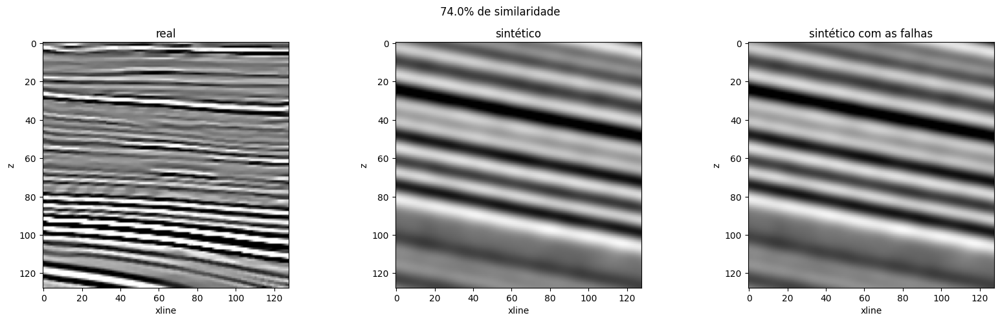

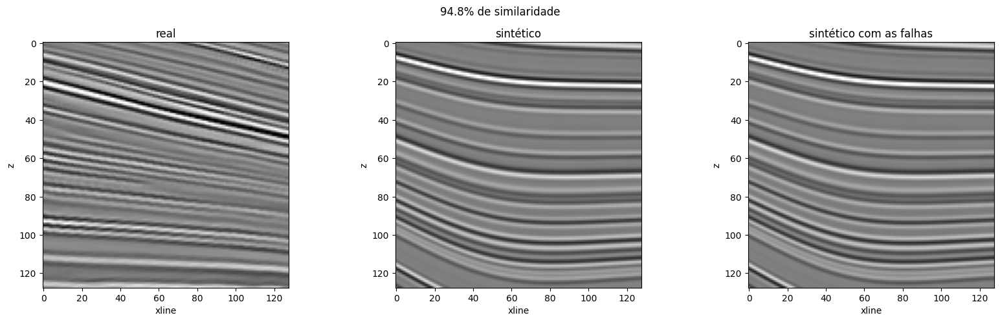

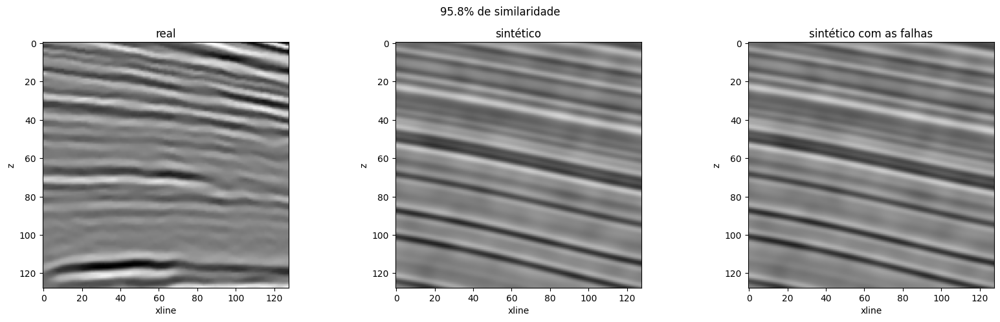

In [14]:
def showRegion(region, n=3):
    images = getFiles(f'{DATASET}/original/{region}/images')
    masks  = getFiles(f'{DATASET}/original/{region}/masks')

    for i in range(n):
        real = np.load(marlim[region][i * len(marlim[region]) // n])
        similarity.plot(real, (np.load(images[i * len(images) // n]) + CLIP) / (2 * CLIP), np.load(masks[i * len(masks) // n]))


showRegion('calm')

- Dead

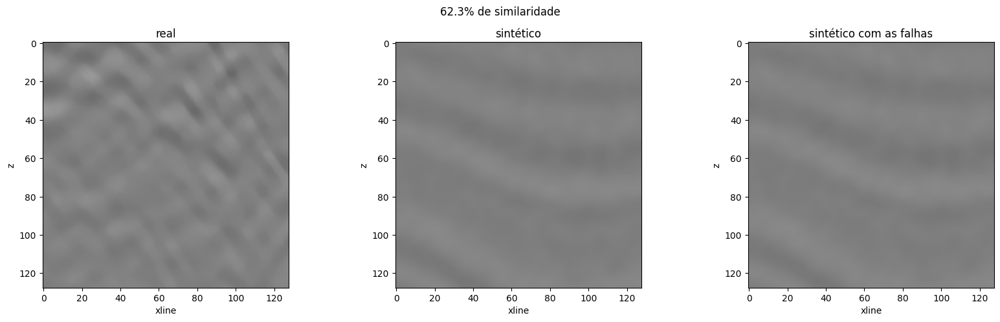

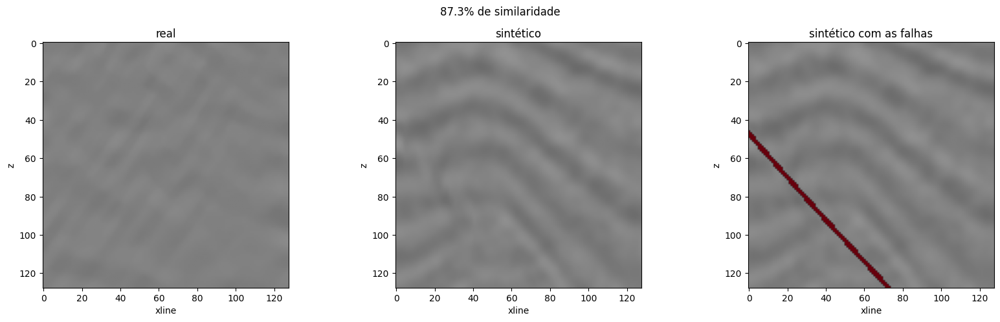

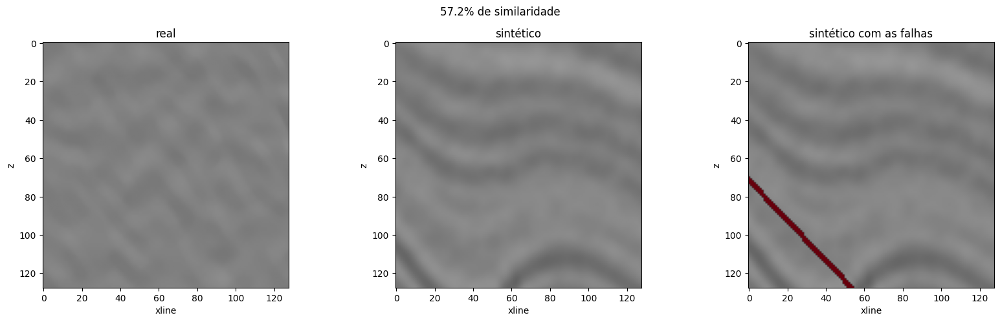

In [15]:
showRegion('dead')

- Faulted

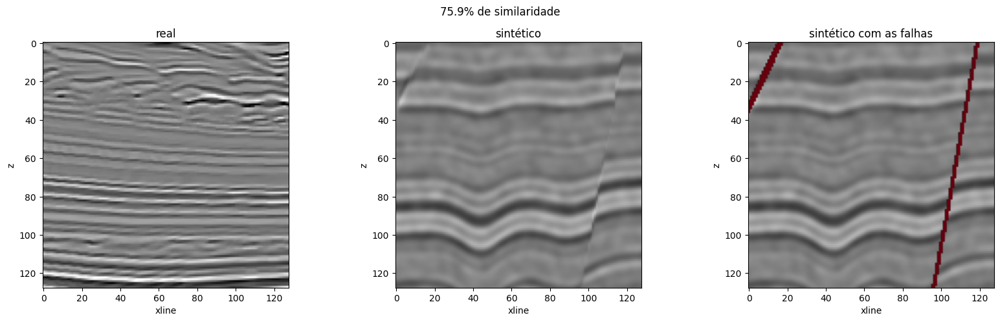

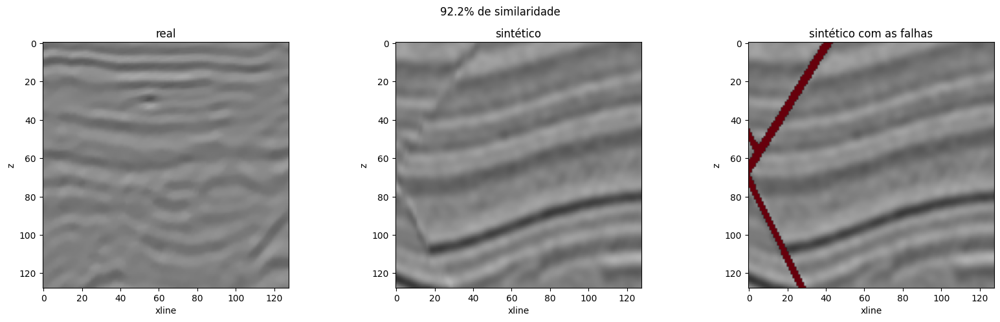

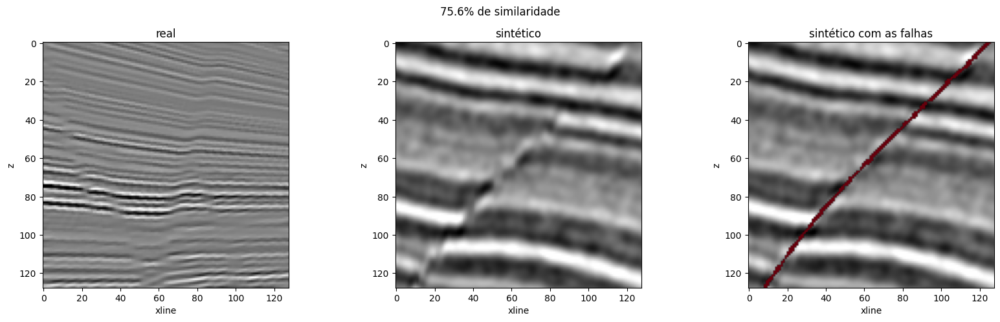

In [16]:
showRegion('faulted')